# Info
Name:  

    Check_4STAR_cloud_retr_ORACLES

Purpose:  

    To go through the steps to check the zenith cloud retrievals from 4STAR.
    To address issues with the parameter calculations that don't match modeled values at all. 

Input:

    None

Output:

    Figures

Keywords:

    none

Dependencies:

    - load_utils.py
    - matplotlib
    - numpy
    - Sp
  
Needed Files:
  - file.rc : for consistent creation of look of matplotlib figures
  - ...

Modification History:
    Written: Samuel LeBlanc, Santa Cruz, CA, 2020-01-22
    Modified: 


# Prepare python environment

In [1]:
import numpy as np
import Sp_parameters as Sp
import load_utils as lu
import write_utils as wu
from path_utils import getpath
import hdf5storage as hs
import scipy.io as sio
import matplotlib.pyplot as plt
%matplotlib notebook
import os


/usr/lib/python2.7/dist-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [ ]:
from datetime import datetime
from matplotlib import animation

In [ ]:
%%javascript
IPython.notebook.kernel.execute('nb_name = "' + IPython.notebook.notebook_name + '"')

In [2]:
%matplotlib notebook

In [3]:
name = 'ORACLES'
vv = 'v1'
fp = getpath(name)


Return path named:  ORACLES /mnt/c/Users/lebla/Research/ORACLES/


The call for the retrieval results:

python ..\..\python_codes\Run_zen_cld_retrieval.py -lut ..\model\v5_10aod_ORACLES_lut.mat .\4STAR_20170818starzen.mat -o ..\zen_ict\v5_10aod\ -liq -plotlut -movie -taurange 1 60 -refrange 2 30


For 20160831 with SZA at 31.0
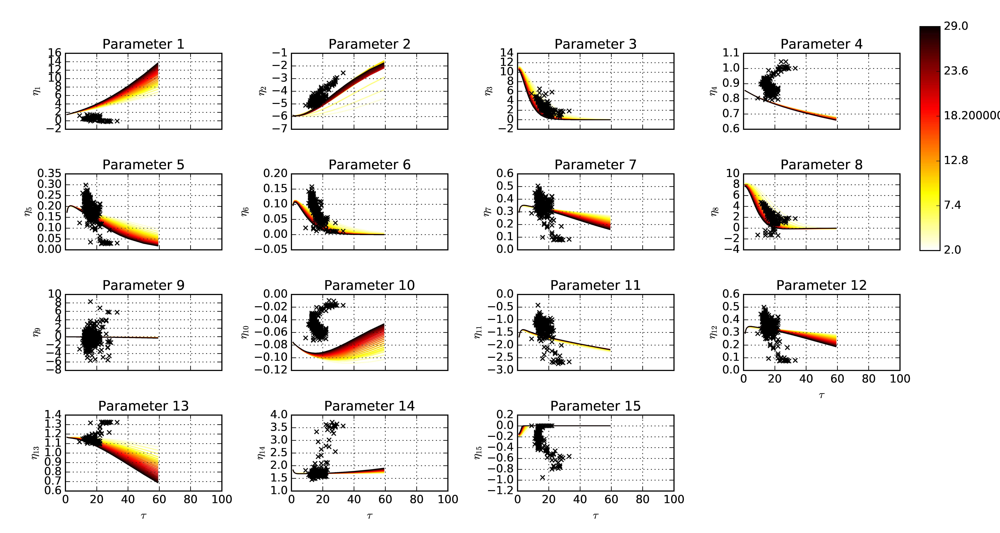
    
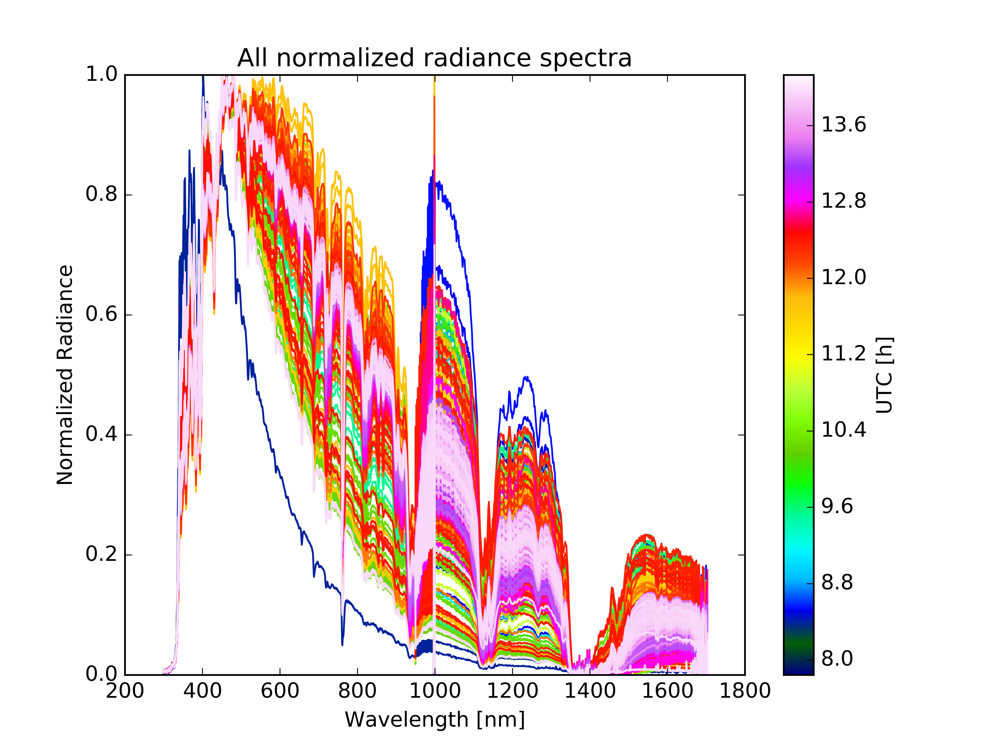

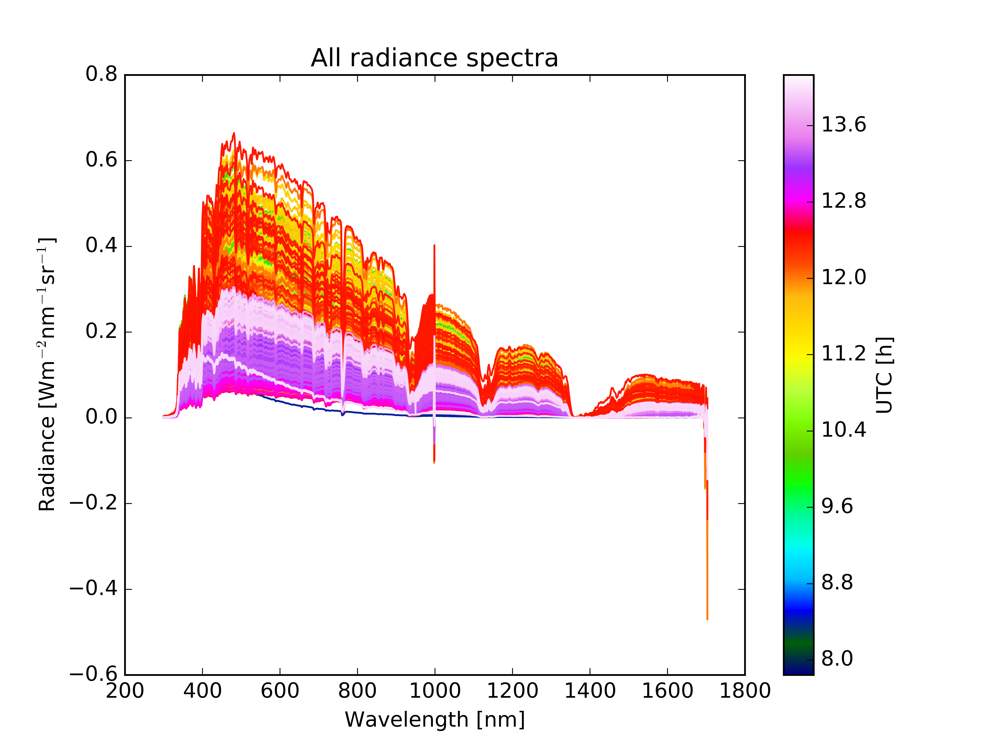


# Load files

In [104]:
daystr = '20160831'

## Load the starzen

In [4]:
fp_starzen = fp+'/starzen/4STAR_{}starzen.mat'.format(daystr)
mea = sio.loadmat(fp_starzen)

In [5]:
tt = lu.mat2py_time(mea['t'])
mea['utc'] = lu.toutc(tt)

In [6]:
print 'Running the parameter calculations on measured spectra'
meas = Sp.Sp(mea,verbose=False)
meas.params()

Running the parameter calculations on measured spectra


### Starzen for different date

In [103]:
daystr2 = '20160914'

In [105]:
fp_starzen2 = fp+'/starzen/4STAR_{}starzen.mat'.format(daystr2)
mea2 = sio.loadmat(fp_starzen2)

In [106]:
tt2 = lu.mat2py_time(mea2['t'])
mea2['utc'] = lu.toutc(tt2)

In [107]:
print 'Running the parameter calculations on measured spectra'
meas2 = Sp.Sp(mea2,verbose=False)
meas2.params()

Running the parameter calculations on measured spectra


## Load the LUT

In [98]:
vlut = 'v5_10aod'

In [7]:
fp_lut_mat = fp+'model/{}_ORACLES_lut.mat'.format(vlut)
luts = hs.loadmat(fp_lut_mat)

In [8]:
airmass = 1./np.cos(luts['sza']*np.pi/180.0)

# Start the retrieval pieces

In [9]:
start_tau = 1.0
end_tau = 60.0
start_ref = 2.0
end_ref = 30.0
forceliq = True
forceice = False
iz = 0

## Prep the LUT

In [10]:
meas.airmass = 1.0/np.cos(meas.sza*np.pi/180.0)
idx = Sp.find_closest(airmass,meas.airmass)

In [108]:
meas2.airmass = 1.0/np.cos(meas2.sza*np.pi/180.0)
idx2 = Sp.find_closest(airmass,meas2.airmass)

In [11]:
lut = []

In [12]:
for s in xrange(len(luts['sza'])):
    sptemp = {}
    sptemp['tau'] = luts['tau']
    sptemp['ref'] = luts['ref']
    sptemp['zout'] = luts['zout']
    sptemp['sza'] = luts['sza']
    sptemp['phase'] = luts['phase']
    sptemp['irr_dn_diff'] = luts['irr_dn_diff'][:,:,:,:,:,s]
    sptemp['irr_dn'] = luts['irr_dn'][:,:,:,:,:,s]
    sptemp['irr_up'] = luts['irr_up'][:,:,:,:,:,s]
    sptemp['wvl'] = [luts['wvl']]
    sptemp['rad'] = luts['rad'][:,:,:,:,:,s]
    ltemp = Sp.Sp(sptemp,verbose=False)
    if s in idx:
        ltemp.params(liq_only=forceliq,ice_only=forceice,iz=iz)
        ltemp.param_hires(start_ref=start_ref,end_ref=end_ref,start_tau=start_tau,end_tau=end_tau)
    lut.append(ltemp)

Running interpolation on params: [########################################]100% -- Done! 


Sp_parameters.py:593: UserWarning: Copyig the parameters calculated for liquid LUT to the ice LUT, ice parameters will be lost
  warnings.warn('Copyig the parameters calculated for liquid LUT to the ice LUT, ice parameters will be lost')


Running interpolation on params: [########################################]100% -- Done! 
Running interpolation on params: [########################################]100% -- Done! 
Running interpolation on params: [########################################]100% -- Done! 
Running interpolation on params: [########################################]100% -- Done! 


## Now run through the retrieval

In [13]:
(meas.taut,meas.ref,meas.phase,meas.ki) = (np.zeros_like(meas.utc),np.zeros_like(meas.utc),np.zeros_like(meas.utc),np.zeros_like(meas.utc))

In [14]:
(meas.taut,meas.ref,meas.phase,meas.ki) = (meas.taut*np.nan,meas.ref*np.nan,meas.phase*np.nan,meas.ki*np.nan)

In [109]:
(meas2.taut,meas2.ref,meas2.phase,meas2.ki) = (np.zeros_like(meas2.utc),np.zeros_like(meas2.utc),np.zeros_like(meas2.utc),np.zeros_like(meas2.utc))
(meas2.taut,meas2.ref,meas2.phase,meas2.ki) = (meas2.taut*np.nan,meas2.ref*np.nan,meas2.phase*np.nan,meas2.ki*np.nan)

In [15]:
import run_kisq_retrieval as rk

In [16]:
print 'Running through the airmasses'
for i in np.unique(idx):
    try: 
        print 'airmass: {airmass}, {i}/{i_tot}'.format(airmass=airmass[i],i=i,i_tot=idx.max()-idx.min())
    except:
        if debug:
            import pdb; pdb.set_trace()
        else: 
            print 'Exception occurred at airmass: {} *** skipping'.format(airmass[i])
    meas.good = np.where(idx==i)[0]

    i500 = np.argmin(abs(meas.wvl-500))
    #i980,i995 = np.argmin(abs(meas.wvl-980)),np.argmin(abs(meas.wvl-995))
    #i999,i992 = np.argmin(abs(meas.wvl-999)),np.argmin(abs(meas.wvl-992))
    i981,i982 = 1039,1040
    #ss = np.nanstd(meas.norm[meas.good,i980:i995],axis=1)/np.nanmean(meas.norm[meas.good,i980:i995],axis=1)
    sss = abs(meas.norm[meas.good,i981]-meas.norm[meas.good,i982])
    #flt = (meas.norm[meas.good,i500]>0.4) & (ss<0.05)
    flt = sss<0.1 #(meas.norm[meas.good,i500]>0.4) & (sss<0.1)
    #import pdb; pdb.set_trace()
    meas.good = meas.good[flt]

    print 'meas.good lengh: {},meas.utc length: {}'.format(meas.good.shape,meas.utc.shape)
    tau,ref,phase,ki = rk.run_retrieval(meas,lut[i],force_liq=forceliq,force_ice=forceice)
    meas.taut[meas.good] = tau[meas.good]
    meas.ref[meas.good] = ref[meas.good]
    meas.phase[meas.good] = phase[meas.good]
    meas.ki[meas.good] = ki[meas.good]

Running through the airmasses
airmass: 1.01871669496, 0/5
meas.good lengh: (233,),meas.utc length: (1337,)
Retrieval progress over times: [########################################]100% -- Done! 
airmass: 1.16663339722, 1/5
meas.good lengh: (422,),meas.utc length: (1337,)
Retrieval progress over times: [########################################]100% -- Done! 
airmass: 1.32501299335, 2/5
meas.good lengh: (150,),meas.utc length: (1337,)
Retrieval progress over times: [########################################]100% -- Done! 
airmass: 1.46627918564, 3/5
meas.good lengh: (237,),meas.utc length: (1337,)
Retrieval progress over times: [########################################]100% -- Done! 
airmass: 1.78829164997, 5/5
meas.good lengh: (8,),meas.utc length: (1337,)
Retrieval progress over times: [########################################]100% -- Done! 


In [17]:
meas.tau = meas.taut

In [110]:
print 'Running through the airmasses'
for i in np.unique(idx2):
    try: 
        print 'airmass: {airmass}, {i}/{i_tot}'.format(airmass=airmass[i],i=i,i_tot=idx.max()-idx.min())
    except:
        if debug:
            import pdb; pdb.set_trace()
        else: 
            print 'Exception occurred at airmass: {} *** skipping'.format(airmass[i])
    meas2.good = np.where(idx2==i)[0]

    i500 = np.argmin(abs(meas2.wvl-500))
    #i980,i995 = np.argmin(abs(meas.wvl-980)),np.argmin(abs(meas.wvl-995))
    #i999,i992 = np.argmin(abs(meas.wvl-999)),np.argmin(abs(meas.wvl-992))
    i981,i982 = 1039,1040
    #ss = np.nanstd(meas.norm[meas.good,i980:i995],axis=1)/np.nanmean(meas.norm[meas.good,i980:i995],axis=1)
    sss = abs(meas2.norm[meas2.good,i981]-meas2.norm[meas2.good,i982])
    #flt = (meas.norm[meas.good,i500]>0.4) & (ss<0.05)
    flt = sss<0.1 #(meas.norm[meas.good,i500]>0.4) & (sss<0.1)
    #import pdb; pdb.set_trace()
    meas2.good = meas2.good[flt]

    print 'meas2.good lengh: {},meas2.utc length: {}'.format(meas2.good.shape,meas2.utc.shape)
    tau,ref,phase,ki = rk.run_retrieval(meas2,lut[i],force_liq=forceliq,force_ice=forceice)
    meas2.taut[meas2.good] = tau[meas2.good]
    meas2.ref[meas2.good] = ref[meas2.good]
    meas2.phase[meas2.good] = phase[meas2.good]
    meas2.ki[meas2.good] = ki[meas2.good]

Running through the airmasses
airmass: 1.01871669496, 0/5
meas2.good lengh: (107,),meas2.utc length: (438,)
Retrieval progress over times: [########################################]100% -- Done! 
airmass: 1.16663339722, 1/5
meas2.good lengh: (210,),meas2.utc length: (438,)
Retrieval progress over times: [########################################]100% -- Done! 
airmass: 1.46627918564, 3/5
meas2.good lengh: (20,),meas2.utc length: (438,)
Retrieval progress over times: [########################################]100% -- Done! 
airmass: 1.62426924548, 4/5
meas2.good lengh: (18,),meas2.utc length: (438,)
Running the interpolation to hi-res
Run params() before
Running the params on current class


Sp_parameters.py:597: UserWarning: Copyig the parameters calculated for Ice LUT to the liquid LUT, liquid parameters will be lost
  warnings.warn('Copyig the parameters calculated for Ice LUT to the liquid LUT, liquid parameters will be lost')


Run params() before
Retrieval progress over times: [########################################]100% -- Done! 


In [111]:
meas2.tau = meas2.taut

# Now plot out the intermediates and results

## Look at overall values

In [18]:
meas.keys()

['tau',
 'verbose',
 'sza',
 'stdparn',
 'phase',
 'airmass',
 'parn_liq',
 'alt',
 'par',
 'hiresirrad',
 'lon',
 'meansp',
 'datestr',
 'iwvls',
 'stdsp',
 'ref',
 'norm',
 'good',
 'iset',
 'parn',
 'stdpar',
 'parn_ice',
 'reflect',
 'isubwvl',
 'wvl',
 'lat',
 'npar',
 'sphires',
 'utc',
 'parhires',
 'sp',
 'irrad',
 'taut',
 'ki']

<IPython.core.display.Javascript object>


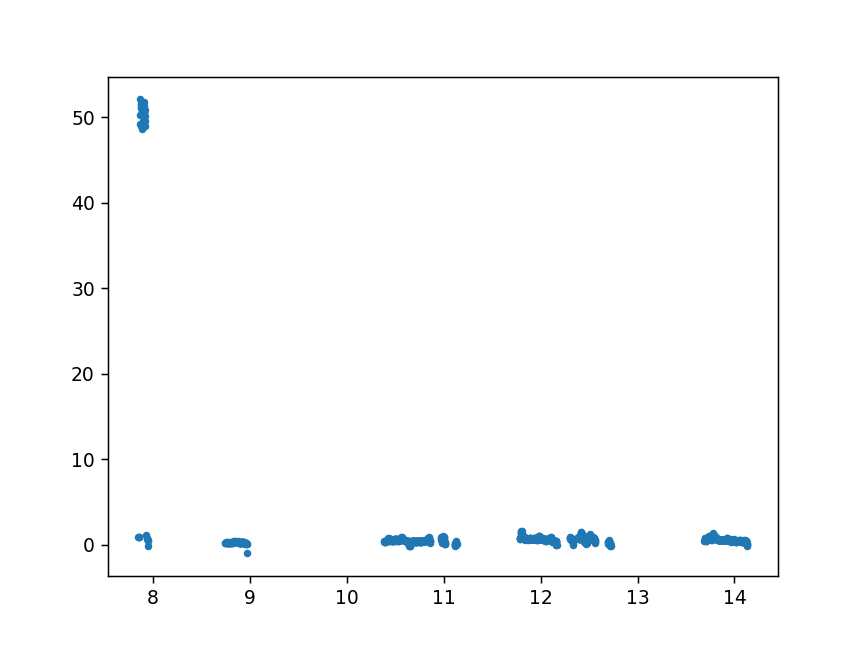

In [19]:
plt.figure()
plt.plot(meas['utc'],meas['par'][:,0],'.')

In [20]:
lut[0].keys()

['tau',
 'verbose',
 'sza',
 'stdparn',
 'help',
 'par',
 'iset',
 'ice',
 'meansp',
 'liq',
 'iwvls',
 'stdsp',
 'ref',
 'norm',
 'hiresirrad',
 'parn',
 'stdpar',
 'reflect',
 'isubwvl',
 'zout',
 'wvl',
 'npar',
 'sphires',
 'refsp',
 'refranges',
 'parhires',
 'sp',
 'irrad',
 'tausp']

In [22]:
lut[0]['par'].shape

(2, 28, 62, 16)

In [23]:
lut[0]['tau'].shape

(62,)

In [24]:
lut[0]['ref'].shape

(28,)

In [25]:
lut[0]['sza'].shape

(16,)

<IPython.core.display.Javascript object>


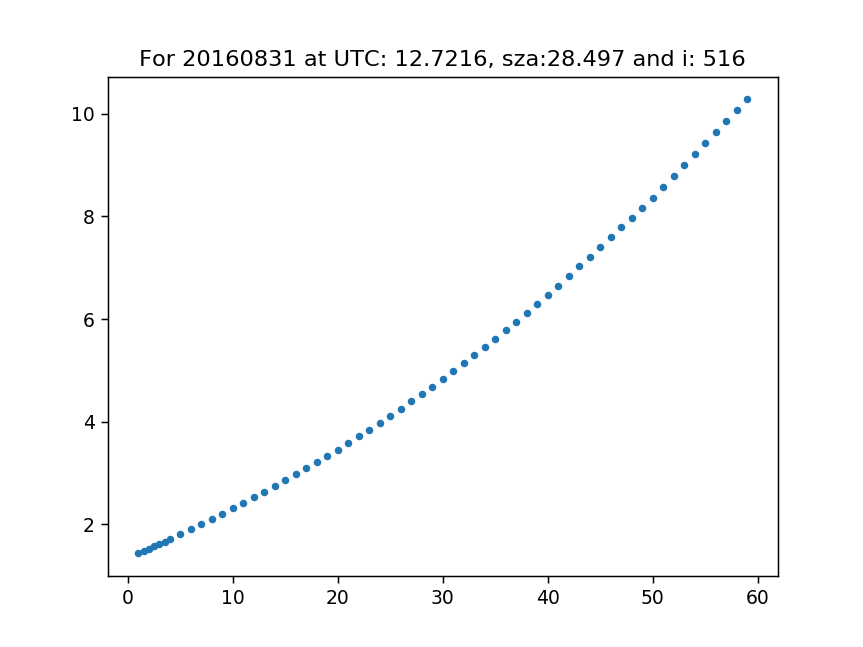

In [26]:
plt.figure()
plt.plot(lut[0]['tau'],lut[0]['par'][0,10,:,0],'.')

## Plot out the lut

In [27]:
from mpltools import color

In [28]:
sza = np.arccos(1.0/airmass)*180.0/np.pi

In [29]:
im = 1

<IPython.core.display.Javascript object>


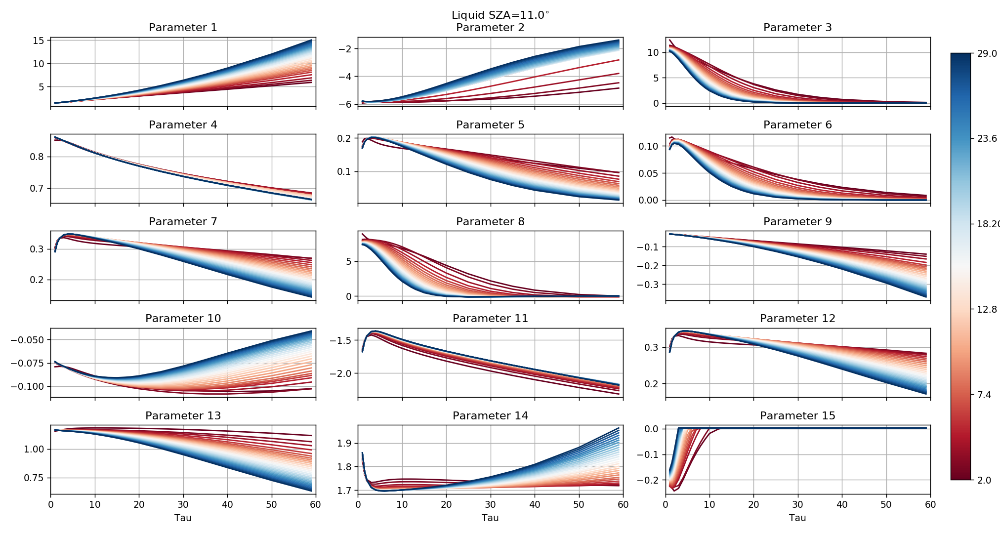

<IPython.core.display.Javascript object>


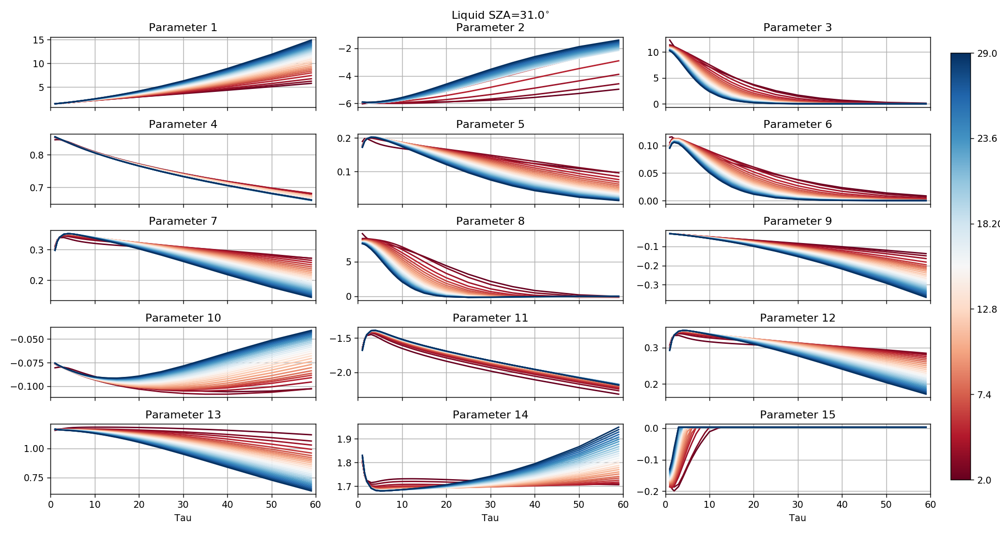

<IPython.core.display.Javascript object>


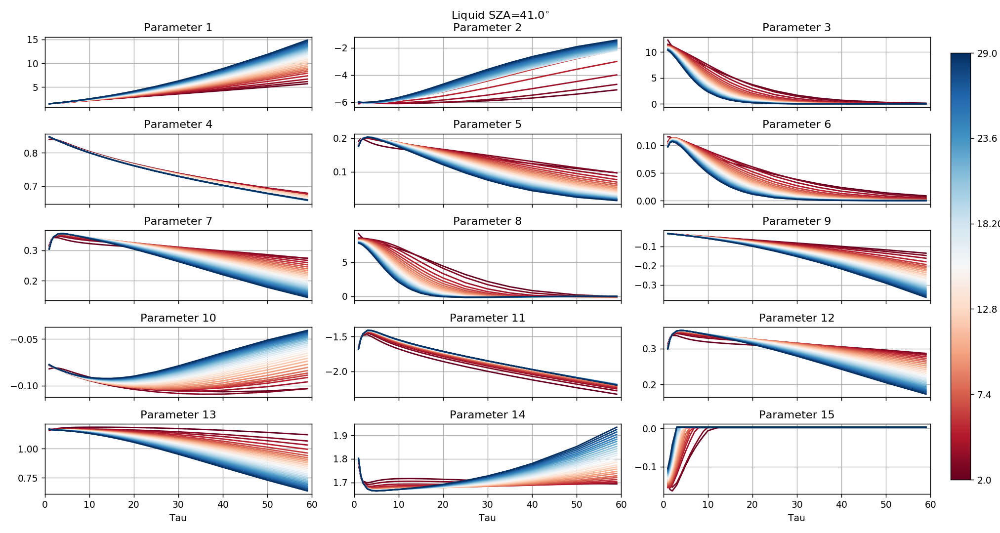

<IPython.core.display.Javascript object>


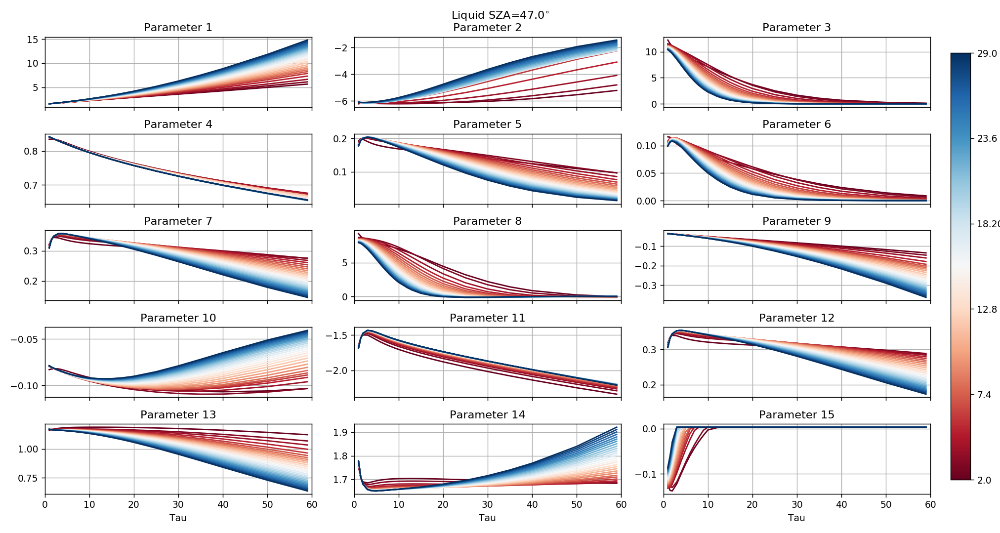

In [113]:
for im in range(4):
    fig3,ax3 = plt.subplots(5,3,sharex=True,figsize=(15,8))
    ax3 = ax3.ravel()

    for i in range(lut[im].npar-1):
        color.cycle_cmap(len(lut[im].ref[lut[im].ref<30]),cmap=plt.cm.RdBu,ax=ax3[i])
        for j in xrange(len(lut[im].ref)):
            ax3[i].plot(lut[im].tau,lut[im].par[0,j,:,i])
        ax3[i].set_title('Parameter '+str(i+1))
        ax3[i].grid()
        ax3[i].set_xlim([0,60])
        if i > 11: 
            ax3[i].set_xlabel('Tau')

    fig3.tight_layout()
    plt.suptitle('Liquid SZA={:2.1f}$^{{\circ}}$'.format(sza[im]))
    plt.subplots_adjust(top=0.93,right=0.93)

    cbar_ax = fig3.add_axes([0.95,0.10,0.02,0.8])
    scalarmap = plt.cm.ScalarMappable(cmap=plt.cm.RdBu,norm=plt.Normalize(vmin=0,vmax=1))
    scalarmap.set_array(lut[im].ref[lut[im].ref<30])
    cba = plt.colorbar(scalarmap,ticks=np.linspace(0,1,6),cax=cbar_ax)
    cba.ax.set_ylabel('R$_{ef}$ [$\\mu$m]')
    cba.ax.set_yticklabels(np.linspace(lut[im].ref[0],29,6));

#plt.show()

In [115]:
meas.par.shape

(1337, 16)

<IPython.core.display.Javascript object>


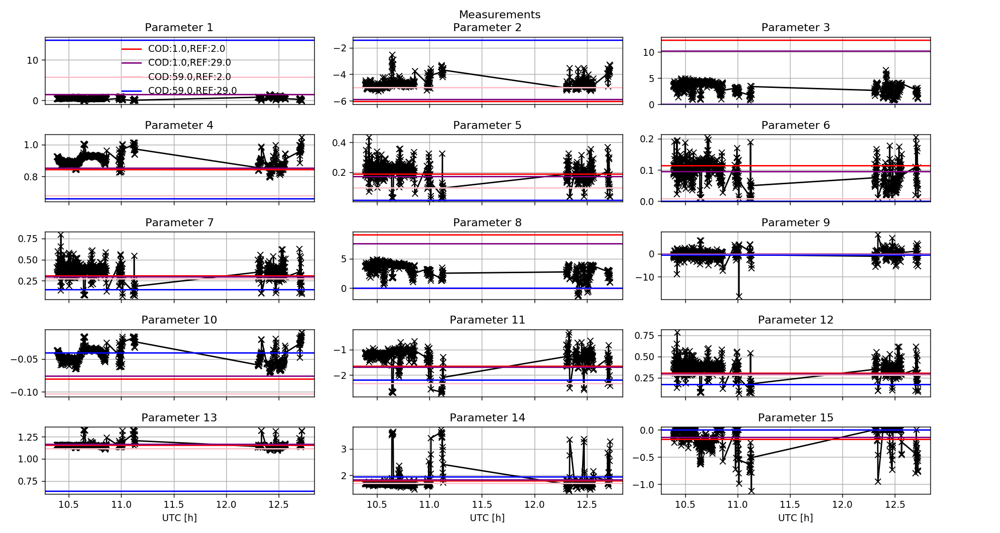

In [127]:

fig3,ax3 = plt.subplots(5,3,sharex=True,figsize=(15,8))
ax3 = ax3.ravel()

for i in range(lut[im].npar-1):
    #color.cycle_cmap(len(lut[im].ref[lut[im].ref<30]),cmap=plt.cm.RdBu,ax=ax3[i])
    #for j in xrange(len(lut[im].ref)):
    #    ax3[i].plot(lut[im].tau,lut[im].par[0,j,:,i])
    
    ax3[i].plot(meas.utc[igood],meas.par[igood,i],'x-k')
    ax3[i].axhline(lut[1].par[0,0,0,i],label='COD:{},REF:{}'.format(lut[1].tau[0],lut[1].ref[0]),color='r')
    ax3[i].axhline(lut[1].par[0,-1,0,i],label='COD:{},REF:{}'.format(lut[1].tau[0],lut[1].ref[-1]),color='purple')
    ax3[i].axhline(lut[1].par[0,0,-1,i],label='COD:{},REF:{}'.format(lut[1].tau[-1],lut[1].ref[0]),color='pink')
    ax3[i].axhline(lut[1].par[0,-1,-1,i],label='COD:{},REF:{}'.format(lut[1].tau[-1],lut[1].ref[-1]),color='b')
    
    if i<1: 
        ax3[i].legend(frameon=False)
    ax3[i].set_title('Parameter '+str(i+1))
    ax3[i].grid()
    #ax3[i].set_xlim([0,60])
    if i > 11: 
        ax3[i].set_xlabel('UTC [h]')

fig3.tight_layout()
plt.suptitle('Measurements'.format(sza[im]))
plt.subplots_adjust(top=0.93,right=0.93)




<IPython.core.display.Javascript object>


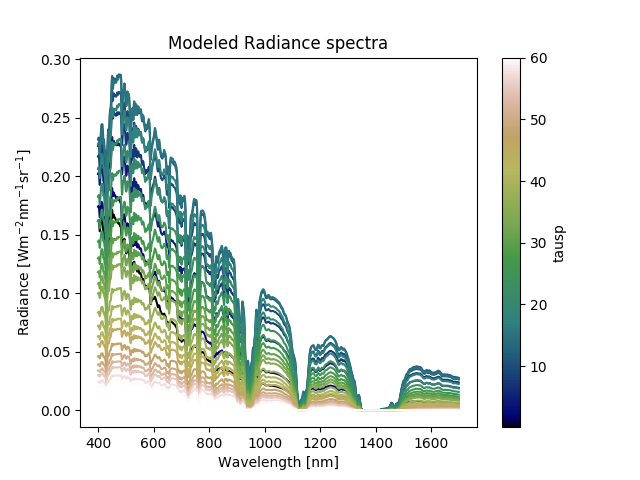

In [78]:
im = 1
pl = Sp.plt_lut_zenrad(lut[im],range_variable='tausp',norm=False,lims=[0,60],cmapname='gist_earth')

<IPython.core.display.Javascript object>


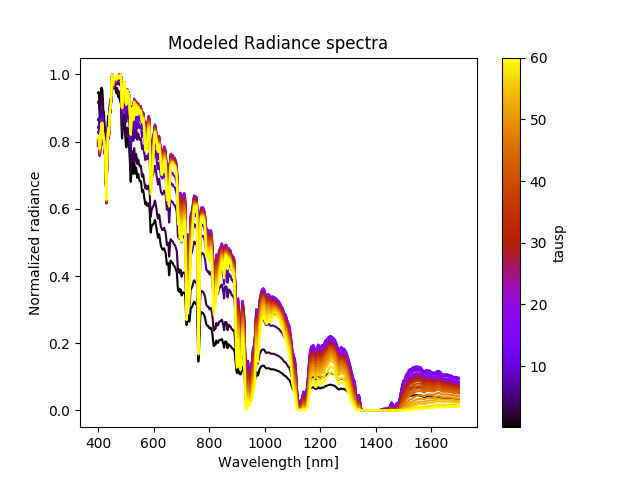

In [80]:
im = 1
pl = Sp.plt_lut_zenrad(lut[im],range_variable='tausp',norm=True,lims=[0,60],cmapname='gnuplot')

<IPython.core.display.Javascript object>


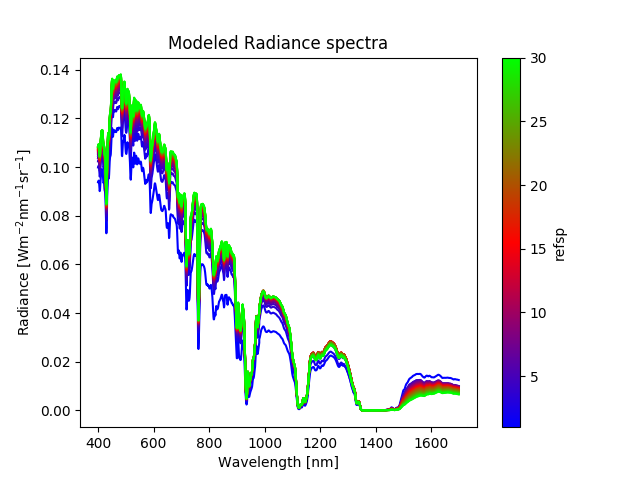

In [85]:
im = 1
pl = Sp.plt_lut_zenrad(lut[im],range_variable='refsp',norm=False,other_index=14,lims=[0,30],cmapname='brg')

## Plot out the measurements

<IPython.core.display.Javascript object>


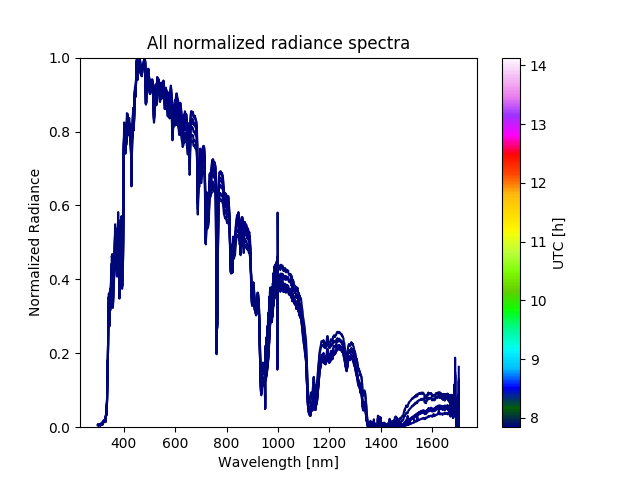

In [86]:
p = Sp.plt_norm_zenrad(meas)

<IPython.core.display.Javascript object>


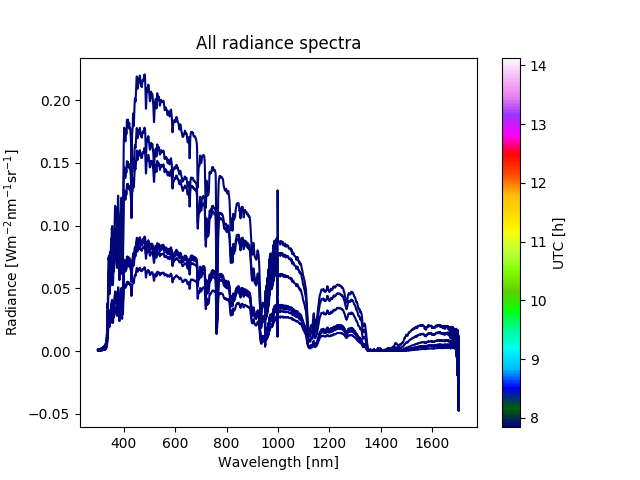

In [87]:
p = Sp.plt_zenrad(meas)

<IPython.core.display.Javascript object>


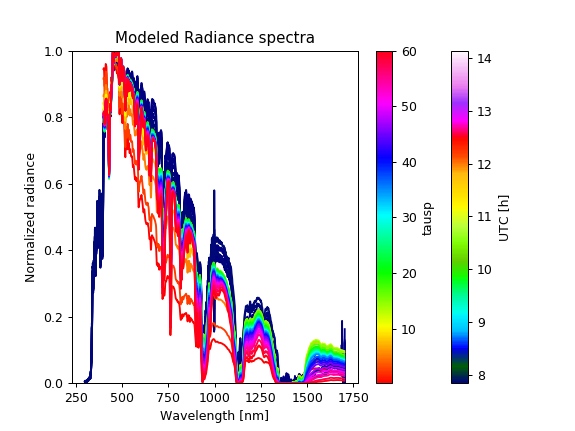

In [90]:
p = Sp.plt_norm_zenrad(meas)
pl = Sp.plt_lut_zenrad(lut[im],range_variable='tausp',norm=True,lims=[0,60],cmapname='hsv',fig=p)

<IPython.core.display.Javascript object>


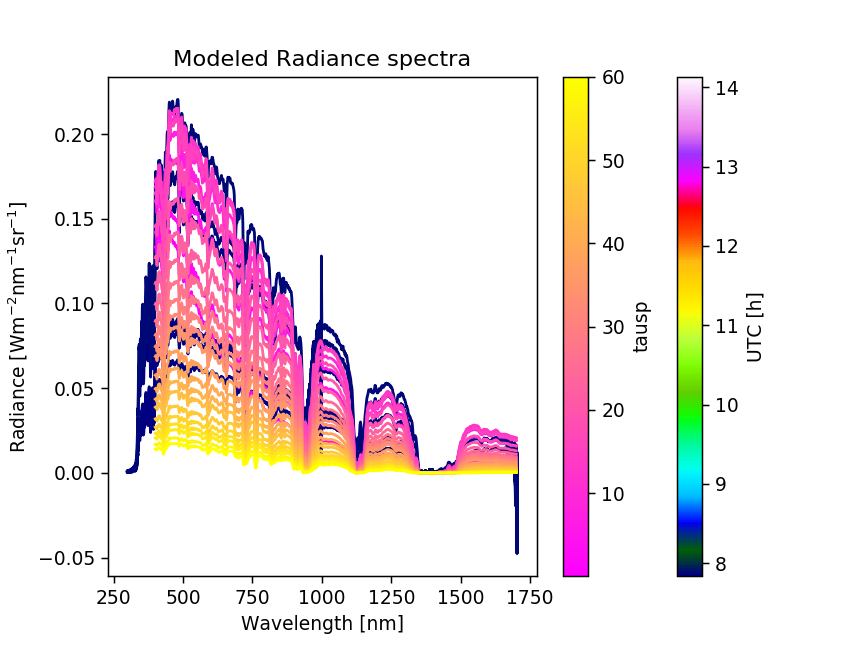

In [133]:
p = Sp.plt_zenrad(meas)
pl = Sp.plt_lut_zenrad(lut[im],range_variable='tausp',norm=False,lims=[0,60],cmapname='spring',fig=p)
pl.set_zorder(-1)
plt.show()

### Now for meas2

<IPython.core.display.Javascript object>


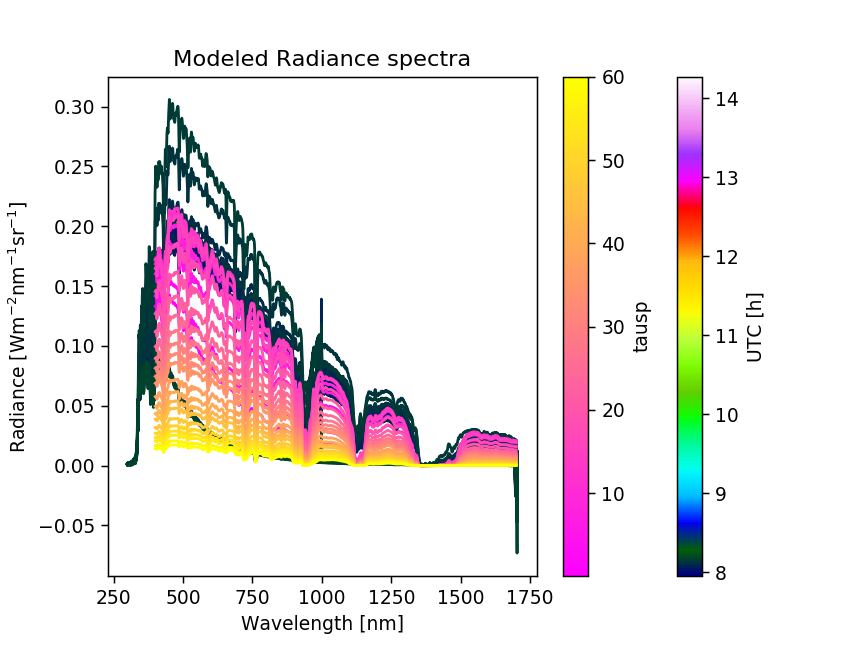

In [134]:
p = Sp.plt_zenrad(meas2)
pl = Sp.plt_lut_zenrad(lut[im],range_variable='tausp',norm=False,lims=[0,60],cmapname='spring',fig=p)

# Got through each parameter

## All parameter definition

In [41]:
from Sp_parameters import nanmasked, norm2max, smooth, deriv, find_closest

In [31]:
def param(sp,wvlin,iws=None):
    " Calculates the parameters from a spectrum."
    from linfit import linfit
    from Sp_parameters import nanmasked, norm2max, smooth, deriv, find_closest
    npar = 16
    #print 'lenght of sp and wvlin',sp.shape,wvlin.shape
    spc, mask = nanmasked(sp)
    try:
        if len(mask.shape)==3:
            mask = mask[:,0,0]
    except:
        pass
    wvl = wvlin[mask]
    if len(wvl)<600:
        par = np.zeros(npar)*np.nan
        return par
    try:
        norm = norm2max(spc,iws=iws)
    except ValueError:
        par = np.zeros(npar)*np.nan
        return par
    [i1000,i1077,i1493,i1600,i1200,i1300,i530,i610,
     i1565,i1634,i1193,i1198,i1236,i1248,i1270,i1644,
     i1050,i1040,i1065,i600,i870,i515] = find_closest(wvl,np.array([1000,1077,1493,1600,1200,1300,530,
                                                     610,1565,1634,1193,1198,1236,1248,
                                                     1270,1644,1050,1040,1065,600,870,515]))
    if np.isnan(spc[i1000]) or not spc[i1000]:
        par = np.zeros(npar)*np.nan
        return par
    norm2 = spc/spc[i1000]
    try:
        dsp = smooth(deriv(norm2,wvl/1000),2,nan=False,old=True)
    except:
        import pdb; pdb.set_trace()
    imaxwvl = np.argmax(spc)
    maxwvl = wvl[mask[imaxwvl]]
    # now calculate each parameter
    fit0 = np.polyfit(np.array([wvl[i1000],wvl[i1077]]),np.array([norm2[i1000],norm2[i1077]]),1)
    fit0_fn = np.poly1d(fit0)
    fit7 = np.polyfit(np.array([wvl[i1493],wvl[i1600]]),np.array([norm2[i1493],norm2[i1600]]),1)
    fit7_fn = np.poly1d(fit7)
    fit8,z = linfit(wvl[i1000:i1077],dsp[i1000:i1077]) 
    fit9,z = linfit(wvl[i1200:i1300],dsp[i1200:i1300])
    fit10,z = linfit(wvl[i530:i610]/1000,norm[i530:i610])
    fit14,z = linfit(wvl[i1565:i1634],spc[i1565:i1634]/norm[i1565])
    par = [sum(norm2[i1000:i1077]-fit0_fn(wvl[i1000:i1077])),   # 1 curvature of rad normed to 1000 nm for 1000 nm - 1077 nm
           dsp[i1198],                                          # 2 deriv of rad normed to 1000 nm at 1198 nm (!=IDL version)
           dsp[i1493],                                          # 3 deriv of rad normed to 1000 nm at 1493 nm
           norm[i1198]/norm[i1236],                             # 4 ratio of normalized rad of 1198 nm / 1236 nm
           np.nanmean(norm[i1248:i1270]),                       # 5 mean of normalized rad between 1248 nm - 1270 nm
           np.nanmean(norm[i1565:i1644]),                       # 6 mean of normalized rad between 1565 nm - 1644 nm
           np.nanmean(norm[i1000:i1050]),                       # 7 mean of normalized rad between 1000 nm - 1050 nm
           sum(norm2[i1493:i1600]-fit7_fn(wvl[i1493:i1600])),   # 8 curvature of rad normed to 1000 nm for 1493 nm - 1600 nm
           fit8[0],                                             # 9 slope of deriv of rad normed to 1000 nm, 1000 nm - 1077 nm
           fit9[0],                                             # 10 slope of deriv of rad normed to 1000 nm, 1200 nm - 1300 nm
           fit10[0],                                            # 11 slope of normalized radiance between 530 nm - 610 nm
           norm[i1040],                                         # 12 normalized radiance at 1040 nm
           norm[i1000]/norm[i1065],                             # 13 ratio of normalized radiance at 1000 nm / 1065 nm
           norm[i600]/norm[i870],                               # 14 ratio of normalized radiance at 600 nm / 870 nm
           np.nanmin([0.003,fit14[0]]),                         # 15 slope of radiance / rad at 1565 between 1565 nm - 1634 nm
           spc[i515]]                                           # 16 radiance at 515 nm
    # do a check for bad points
    if np.all(np.isnan(par[0:13])): 
        par[14] = np.nan
        par[15] = np.nan
    return param

In [32]:
igood = np.where((idx[:,0]==1) & np.isfinite(meas.par[:,0]))[0]

In [146]:
igood2 = np.where((idx2[:,0]==1) & np.isfinite(meas2.par[:,0]))[0]

## Parameter 1: Curvature between 1000-1100

In [33]:
meas.wvl

array([ 173.182     ,  173.975     ,  174.768     , ..., 1701.83968988,
       1703.01      , 1703.01445507])

In [34]:
i1000 = np.argmin(abs(meas.wvl-1000.0))
i1077 = np.argmin(abs(meas.wvl-1077.0))

In [35]:
def plt_param1(sp,wvl,fig=None):
    from Sp_parameters import nanmasked
    if not fig:
        fig = plt.figure()
    
    spc, mask = nanmasked(sp)
    wvln = wvl[mask]
    i1000 = np.argmin(abs(wvln-1000.0))
    i1077 = np.argmin(abs(wvln-1077.0))
    norm = spc / spc[i1000]
    
    line_og = plt.plot(wvln,norm,'.b',label='original')
    line_nd = plt.plot([wvln[i1000],wvln[i1077]],[norm[i1000],norm[i1077]],'sg',label='ends')
    fit0 = np.polyfit(np.array([wvln[i1000],wvln[i1077]]),np.array([norm[i1000],norm[i1077]]),1)
    fit0_fn = np.poly1d(fit0)
    line_ft = plt.plot(wvln[i1000:i1077],fit0_fn(wvln[i1000:i1077]),'-k',lw=2,label='line fit')
    line_cv = plt.plot(wvln[i1000:i1077],norm[i1000:i1077],'-r',lw=2,label='curve')
    par1 = sum(norm[i1000:i1077]-fit0_fn(wvln[i1000:i1077]))
    fill_pr = plt.fill_between(wvln[i1000:i1077],fit0_fn(wvln[i1000:i1077]),norm[i1000:i1077],color='grey',alpha=0.4,label='par1= {:2.2f}'.format(par1))
    
    plt.xlim([970,1130])
    plt.ylim([0,1.5])
    plt.legend(frameon=False)
    return fig, line_og[0],line_nd[0],line_ft[0],line_cv[0],fill_pr

<IPython.core.display.Javascript object>


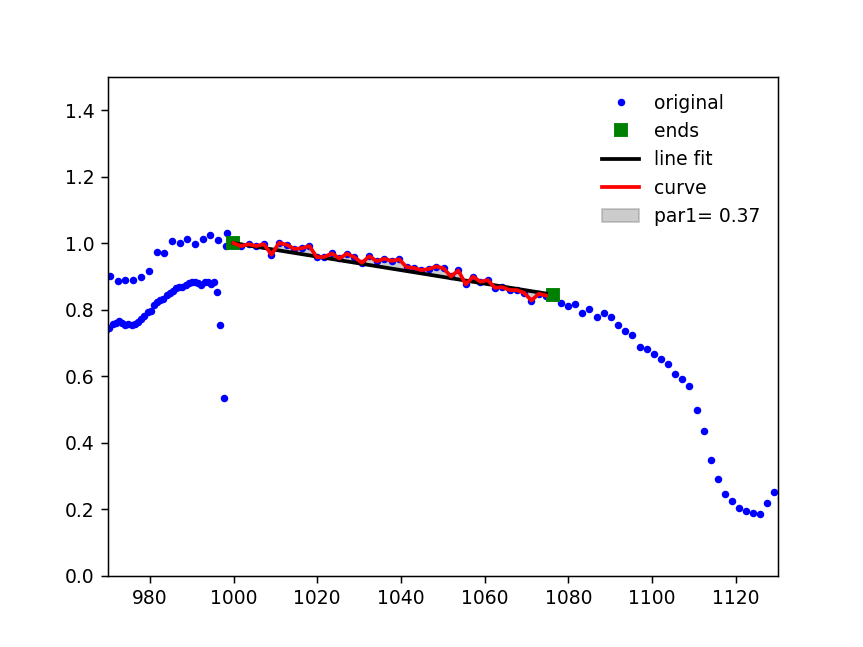

(<Figure size 640x480 with 1 Axes>,
 <matplotlib.collections.PolyCollection at 0x7fc29ed9eb90>)

In [36]:
plt_param1(meas.sp[igood][0],meas.wvl)

### Make some animations

In [37]:
from IPython.display import HTML

def display_animation(anim):
    plt.close(anim._fig)
    return HTML(anim_to_html(anim))

In [277]:
p.vertices[:,1]

Traceback (most recent call last):
  File "/usr/lib/python2.7/logging/__init__.py", line 889, in emit
    stream.write(fs % msg)
IOError: [Errno 5] Input/output error
Logged from file ioloop.py, line 801
Traceback (most recent call last):
  File "/usr/lib/python2.7/logging/__init__.py", line 889, in emit
    stream.write(fs % msg)
IOError: [Errno 5] Input/output error
Logged from file ioloop.py, line 801
Traceback (most recent call last):
  File "/usr/lib/python2.7/logging/__init__.py", line 889, in emit
    stream.write(fs % msg)
IOError: [Errno 5] Input/output error
Logged from file ioloop.py, line 801
Traceback (most recent call last):
  File "/usr/lib/python2.7/logging/__init__.py", line 889, in emit
    stream.write(fs % msg)
IOError: [Errno 5] Input/output error
Logged from file ioloop.py, line 801
Traceback (most recent call last):
  File "/usr/lib/python2.7/logging/__init__.py", line 889, in emit
    stream.write(fs % msg)
IOError: [Errno 5] Input/output error
Logged from file 

array([1.        , 1.        , 0.99629515, 0.99259507, 0.98889973,
       0.98520912, 0.98152322, 0.97784203, 0.97416551, 0.97049366,
       0.96682645, 0.96316388, 0.95950592, 0.95585256, 0.95220379,
       0.94855958, 0.94491993, 0.94128481, 0.93765421, 0.93402811,
       0.9304065 , 0.92678936, 0.92317668, 0.91956845, 0.91596463,
       0.91236523, 0.90877022, 0.90517959, 0.90159332, 0.8980114 ,
       0.89443381, 0.89086054, 0.88729158, 0.8837269 , 0.88016649,
       0.87661034, 0.87305844, 0.86951076, 0.86596729, 0.86242802,
       0.85889293, 0.85536201, 0.85183525, 0.84831262, 0.84225204,
       0.84225204, 0.84770776, 0.82731143, 0.85009146, 0.85853864,
       0.85879709, 0.86735698, 0.86554928, 0.88882048, 0.88377875,
       0.89910535, 0.87594281, 0.91764009, 0.89962813, 0.92415244,
       0.92949731, 0.92203949, 0.9186822 , 0.9251463 , 0.92784397,
       0.95130647, 0.94640205, 0.95315507, 0.9452598 , 0.96057695,
       0.94056336, 0.95755151, 0.96812077, 0.95386892, 0.96902

In [282]:
np.hstack([fit0_fn(wvln[i1000:i1077])[0],fit0_fn(wvln[i1000:i1077]),norm[i1000:i1077][-1],norm[i1000:i1077][:0:-1],norm[i1000:i1077][0],norm[i1000:i1077][0]])

Traceback (most recent call last):
  File "/usr/lib/python2.7/logging/__init__.py", line 889, in emit
    stream.write(fs % msg)
IOError: [Errno 5] Input/output error
Logged from file ioloop.py, line 801


array([1.        , 1.        , 0.99629515, 0.99259507, 0.98889973,
       0.98520912, 0.98152322, 0.97784203, 0.97416551, 0.97049366,
       0.96682645, 0.96316388, 0.95950592, 0.95585256, 0.95220379,
       0.94855958, 0.94491993, 0.94128481, 0.93765421, 0.93402811,
       0.9304065 , 0.92678936, 0.92317668, 0.91956845, 0.91596463,
       0.91236523, 0.90877022, 0.90517959, 0.90159332, 0.8980114 ,
       0.89443381, 0.89086054, 0.88729158, 0.8837269 , 0.88016649,
       0.87661034, 0.87305844, 0.86951076, 0.86596729, 0.86242802,
       0.85889293, 0.85536201, 0.85183525, 0.84831262, 0.84225204,
       0.84225204, 0.84770776, 0.82731143, 0.85009146, 0.85853864,
       0.85879709, 0.86735698, 0.86554928, 0.88882048, 0.88377875,
       0.89910535, 0.87594281, 0.91764009, 0.89962813, 0.92415244,
       0.92949731, 0.92203949, 0.9186822 , 0.9251463 , 0.92784397,
       0.95130647, 0.94640205, 0.95315507, 0.9452598 , 0.96057695,
       0.94056336, 0.95755151, 0.96812077, 0.95386892, 0.96902

Traceback (most recent call last):
  File "/usr/lib/python2.7/logging/__init__.py", line 889, in emit
    stream.write(fs % msg)
IOError: [Errno 5] Input/output error
Logged from file ioloop.py, line 801
Traceback (most recent call last):
  File "/usr/lib/python2.7/logging/__init__.py", line 889, in emit
    stream.write(fs % msg)
IOError: [Errno 5] Input/output error
Logged from file ioloop.py, line 801
Traceback (most recent call last):
  File "/usr/lib/python2.7/logging/__init__.py", line 889, in emit
    stream.write(fs % msg)
IOError: [Errno 5] Input/output error
Logged from file ioloop.py, line 801


<IPython.core.display.Javascript object>


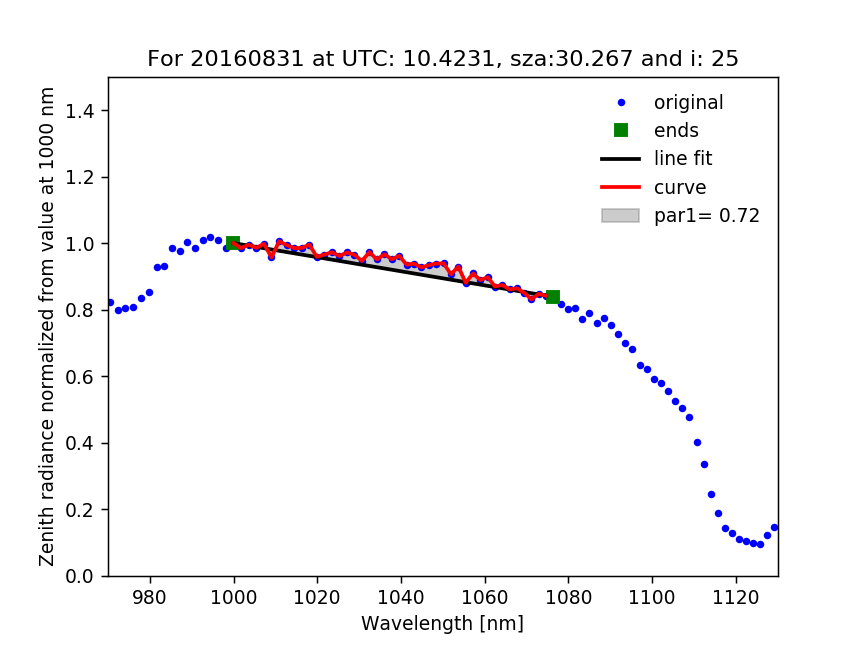

In [255]:
fig, line_og,line_nd,line_ft,line_cv,fill_pr = plt_param1(meas.sp[igood][0],meas.wvl)
plt.xlabel('Wavelength [nm]')
plt.ylabel('Zenith radiance normalized from value at 1000 nm')

def init():
    line_og.set_data([], [])
    line_nd.set_data([], [])
    line_ft.set_data([], [])
    line_cv.set_data([], [])
    p = fill_pr.get_paths()[0]
    p.vertices[:,1] = p.vertices[:,1]*0.0
    return fig,line_og,line_nd,line_ft,line_cv,fill_pr

def animate(i):
    
    sp,wvl = meas.sp[igood][i],meas.wvl
    plt.title('For {} at UTC: {:2.4f}, sza:{:2.3f} and i: {}'.format(daystr,meas.utc[igood][i],meas.sza[igood][i][0],i))
    spc, mask = nanmasked(sp)
    wvln = wvl[mask]
    i1000 = np.argmin(abs(wvln-1000.0))
    i1077 = np.argmin(abs(wvln-1077.0))
    norm = spc / spc[i1000]
    
    line_og.set_data(wvln,norm)
    line_nd.set_data([wvln[i1000],wvln[i1077]],[norm[i1000],norm[i1077]])
    fit0 = np.polyfit(np.array([wvln[i1000],wvln[i1077]]),np.array([norm[i1000],norm[i1077]]),1)
    fit0_fn = np.poly1d(fit0)
    line_ft.set_data(wvln[i1000:i1077],fit0_fn(wvln[i1000:i1077]))
    line_cv.set_data(wvln[i1000:i1077],norm[i1000:i1077])
    par1 = sum(norm[i1000:i1077]-fit0_fn(wvln[i1000:i1077]))    
    #fill_pr = fig.gca().fill_between(wvln[i1000:i1077],fit0_fn(wvln[i1000:i1077]),norm[i1000:i1077],color='grey',alpha=0.4,label='par1= {:2.2f}'.format(par1))
    
    p = fill_pr.get_paths()[0]
    p.vertices[:,1] = np.hstack([fit0_fn(wvln[i1000:i1077])[0],fit0_fn(wvln[i1000:i1077]),
                                 norm[i1000:i1077][-1],norm[i1000:i1077][:0:-1],norm[i1000:i1077][0],norm[i1000:i1077][0]])
    fill_pr.set_label('par1= {:2.2f}'.format(par1))
    plt.legend(frameon=False)
    
    return fig,line_og,line_nd,line_ft,line_cv,fill_pr

anim = animation.FuncAnimation(fig, animate,init_func=init,frames=len(meas.utc[igood]), interval=20, blit=True)

#HTML(anim.to_jshtml())

In [138]:
nb_name

'Check_4STAR_cloud_retr_ORACLES.ipynb'

In [139]:
metadata = dict(artist='Samuel LeBlanc',title='Parameter 1 animations for {}'.format(daystr),comment='Created on {} with the program {}'.format(datetime.now(),nb_name))

In [140]:
# Set up formatting for the movie files
Writer = animation.writers['ffmpeg']
writer = Writer(fps=10, metadata=metadata, bitrate=1800)

In [141]:
anim.save(fp+'starzen/Parameter1_{}.mp4'.format(daystr),writer=writer)

### Plot out measurement day 2

<IPython.core.display.Javascript object>


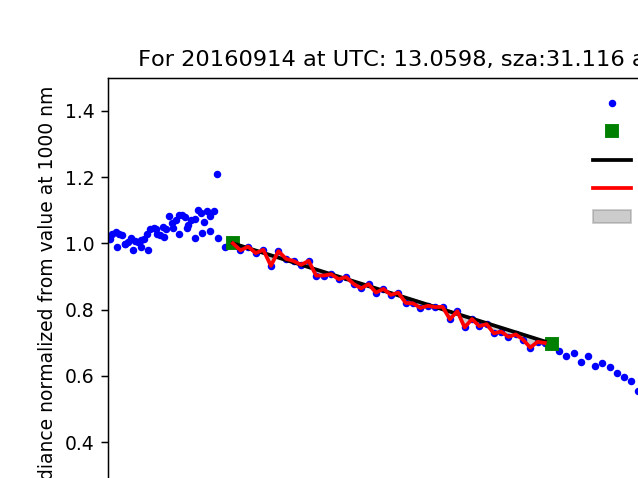

In [151]:
fig, line_og,line_nd,line_ft,line_cv,fill_pr = plt_param1(meas2.sp[igood2][0],meas2.wvl)
plt.xlabel('Wavelength [nm]')
plt.ylabel('Zenith radiance normalized from value at 1000 nm')

def init():
    line_og.set_data([], [])
    line_nd.set_data([], [])
    line_ft.set_data([], [])
    line_cv.set_data([], [])
    p = fill_pr.get_paths()[0]
    p.vertices[:,1] = p.vertices[:,1]*0.0
    return fig,line_og,line_nd,line_ft,line_cv,fill_pr

def animate(i):
    
    sp,wvl = meas2.sp[igood2][i],meas.wvl
    plt.title('For {} at UTC: {:2.4f}, sza:{:2.3f} and i: {}'.format(daystr2,meas2.utc[igood2][i],meas2.sza[igood2][i][0],i))
    spc, mask = nanmasked(sp)
    wvln = wvl[mask]
    i1000 = np.argmin(abs(wvln-1000.0))
    i1077 = np.argmin(abs(wvln-1077.0))
    norm = spc / spc[i1000]
    
    line_og.set_data(wvln,norm)
    line_nd.set_data([wvln[i1000],wvln[i1077]],[norm[i1000],norm[i1077]])
    fit0 = np.polyfit(np.array([wvln[i1000],wvln[i1077]]),np.array([norm[i1000],norm[i1077]]),1)
    fit0_fn = np.poly1d(fit0)
    line_ft.set_data(wvln[i1000:i1077],fit0_fn(wvln[i1000:i1077]))
    line_cv.set_data(wvln[i1000:i1077],norm[i1000:i1077])
    par1 = sum(norm[i1000:i1077]-fit0_fn(wvln[i1000:i1077]))    
    #fill_pr = fig.gca().fill_between(wvln[i1000:i1077],fit0_fn(wvln[i1000:i1077]),norm[i1000:i1077],color='grey',alpha=0.4,label='par1= {:2.2f}'.format(par1))
    
    p = fill_pr.get_paths()[0]
    p.vertices[:,1] = np.hstack([fit0_fn(wvln[i1000:i1077])[0],fit0_fn(wvln[i1000:i1077]),
                                 norm[i1000:i1077][-1],norm[i1000:i1077][:0:-1],norm[i1000:i1077][0],norm[i1000:i1077][0]])
    fill_pr.set_label('par1= {:2.2f}'.format(par1))
    plt.legend(frameon=False)
    
    return fig,line_og,line_nd,line_ft,line_cv,fill_pr

anim2 = animation.FuncAnimation(fig, animate,init_func=init,frames=len(meas2.utc[igood2]), interval=10, blit=True)


In [152]:
metadata = dict(artist='Samuel LeBlanc',title='Parameter 1 animations for {}'.format(daystr2),
                comment='Created on {} with the program {}'.format(datetime.now(),nb_name))
Writer = animation.writers['ffmpeg']
writer = Writer(fps=10, metadata=metadata, bitrate=1800)
anim2.save(fp+'starzen/Parameter1_{}.mp4'.format(daystr2),writer=writer)

### Plot out animation for lut

In [288]:
lut[0].sp.shape

(2, 1302, 3, 35, 27)

In [289]:
lut[1].tausp.shape

(27,)

Traceback (most recent call last):
  File "/usr/lib/python2.7/logging/__init__.py", line 889, in emit
    stream.write(fs % msg)
IOError: [Errno 5] Input/output error
Logged from file ioloop.py, line 801
Traceback (most recent call last):
  File "/usr/lib/python2.7/logging/__init__.py", line 889, in emit
    stream.write(fs % msg)
IOError: [Errno 5] Input/output error
Logged from file ioloop.py, line 801
Traceback (most recent call last):
  File "/usr/lib/python2.7/logging/__init__.py", line 889, in emit
    stream.write(fs % msg)
IOError: [Errno 5] Input/output error
Logged from file ioloop.py, line 801


In [84]:
lut[1].sza[1]

array([11., 31., 41., 47., 52., 56., 59., 61., 63., 65., 67., 68., 69.,
       70., 71., 72.])

<IPython.core.display.Javascript object>


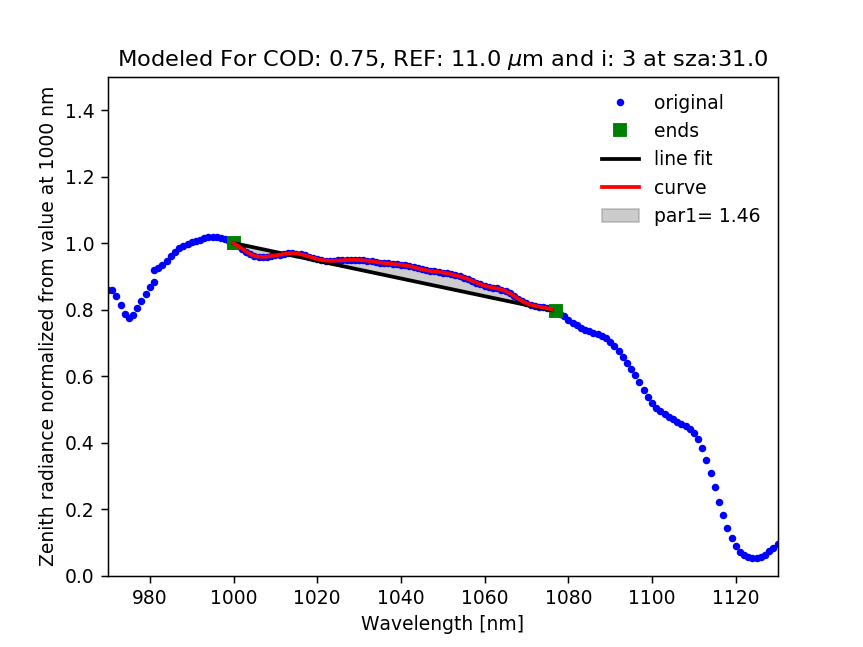

In [254]:
fig, line_og,line_nd,line_ft,line_cv,fill_pr = plt_param1(lut[1].sp[0,:,0,10,0],lut[1].wvl)
                                                                    
plt.xlabel('Wavelength [nm]')
plt.ylabel('Zenith radiance normalized from value at 1000 nm')

def init():
    line_og.set_data([], [])
    line_nd.set_data([], [])
    line_ft.set_data([], [])
    line_cv.set_data([], [])
    p = fill_pr.get_paths()[0]
    p.vertices[:,1] = p.vertices[:,1]*0.0
    return fig,line_og,line_nd,line_ft,line_cv,fill_pr

def animate(i):
    
    sp,wvl = lut[1].sp[0,:,0,10,i],lut[1].wvl
    plt.title('Modeled For COD: {}, REF: {} $\\mu$m and i: {} at sza:{}'.format(lut[1].tausp[i],lut[1].refsp[10],i,lut[1].sza[1]))
    spc, mask = nanmasked(sp)
    wvln = wvl[mask]
    i1000 = np.argmin(abs(wvln-1000.0))
    i1077 = np.argmin(abs(wvln-1077.0))
    norm = spc / spc[i1000]
    
    line_og.set_data(wvln,norm)
    line_nd.set_data([wvln[i1000],wvln[i1077]],[norm[i1000],norm[i1077]])
    fit0 = np.polyfit(np.array([wvln[i1000],wvln[i1077]]),np.array([norm[i1000],norm[i1077]]),1)
    fit0_fn = np.poly1d(fit0)
    line_ft.set_data(wvln[i1000:i1077],fit0_fn(wvln[i1000:i1077]))
    line_cv.set_data(wvln[i1000:i1077],norm[i1000:i1077])
    par1 = sum(norm[i1000:i1077]-fit0_fn(wvln[i1000:i1077]))    
    #fill_pr = fig.gca().fill_between(wvln[i1000:i1077],fit0_fn(wvln[i1000:i1077]),norm[i1000:i1077],color='grey',alpha=0.4,label='par1= {:2.2f}'.format(par1))
    
    p = fill_pr.get_paths()[0]
    p.vertices[:,1] = np.hstack([fit0_fn(wvln[i1000:i1077])[0],fit0_fn(wvln[i1000:i1077]),
                                 norm[i1000:i1077][-1],norm[i1000:i1077][:0:-1],norm[i1000:i1077][0],norm[i1000:i1077][0]])
    fill_pr.set_label('par1= {:2.2f}'.format(par1))
    plt.legend(frameon=False)
    
    return fig,line_og,line_nd,line_ft,line_cv,fill_pr

anim = animation.FuncAnimation(fig, animate,init_func=init,frames=len(lut[1].tausp), interval=10, blit=True)

#HTML(anim.to_jshtml())

In [144]:
metadata = dict(artist='Samuel LeBlanc',title='Parameter 1 animations for LUT file {} for sza: {}'.format(fp_lut_mat.split('/')[-1],lut[1].sza[1]),comment='Created on {} with the program {}'.format(datetime.now(),nb_name))

In [145]:
# Set up formatting for the movie files
Writer = animation.writers['ffmpeg']
writer = Writer(fps=10, metadata=metadata, bitrate=1800)
anim.save(fp+'starzen/Parameter1_LUT_{}.mp4'.format(vlut),writer=writer)

## Parameter 2: Derivative at 1200 nm

### Define parameter

In [182]:
def plt_param2(sp,wvl,fig=None):
    from Sp_parameters import nanmasked
    if not fig:
        fig = plt.figure()


    spc, mask = nanmasked(sp)
    wvln = wvl[mask]
    i1000 = np.argmin(abs(wvln-1000.0))
    i1198 = np.argmin(abs(wvln-1198.0))
    norm2 = spc/spc[i1000]
    dsp = smooth(deriv(norm2,wvln/1000.0),2,nan=False,old=True)

    par2 = dsp[i1198]
    
    
    ax1 = fig.add_subplot(2,1,1)
    line_og = ax1.plot(wvln,spc,'.b',label='original')
    line_sp = ax1.plot([wvln[i1198],wvln[i1198]],[spc[i1198],spc[i1198]],'ok')
    ax1.set_ylabel('Radiance [W/m$^2$/nm/sr]')
    ax1.set_ylim(0,300)
    
    ax2 = fig.add_subplot(2,1,2,sharex=ax1)
    line_dsp = ax2.plot(wvln,dsp,'.k',label='Differential')
    line_par = ax2.plot([wvln[i1198],wvln[i1198]],[par2,par2],'sg',label='Par2={:2.2f}'.format(par2)) 
    ax2.set_xlim(970,1300)
    ax2.set_ylim(-30,40)
    ax2.set_ylabel('Derivative of\nnormalized radiance')
    ax2.set_xlabel('Wavelength [nm]')
    
    plt.legend(frameon=False)
    return fig, ax1,ax2,line_og[0],line_sp[0],line_dsp[0],line_par[0]

In [157]:
sp = meas.sp[igood][0]
wvl = meas.wvl

<IPython.core.display.Javascript object>


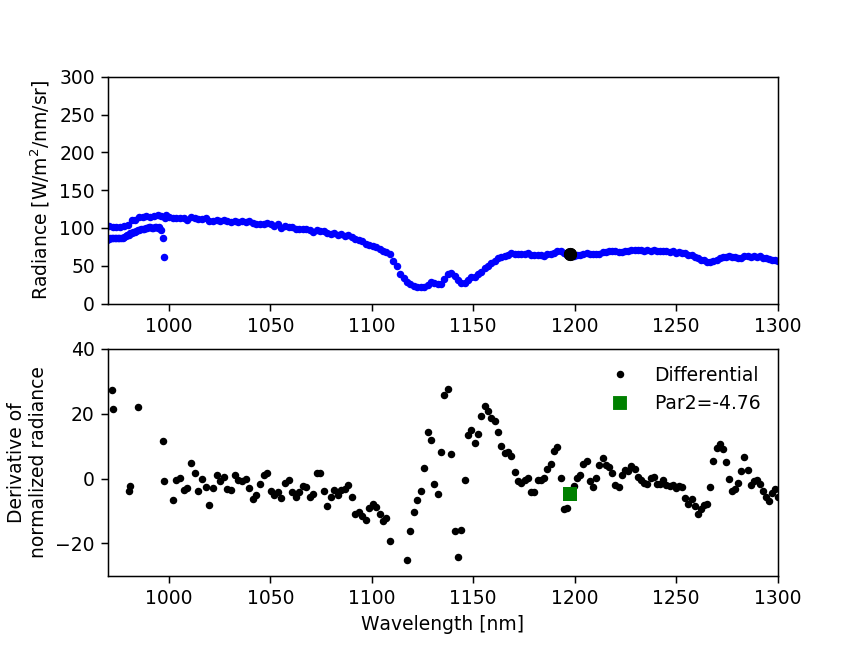

(<Figure size 640x480 with 2 Axes>,
 <matplotlib.lines.Line2D at 0x7fc153463350>)

In [178]:
plt_param2(meas.sp[igood][0],meas.wvl)

### Plot the measurements

<IPython.core.display.Javascript object>


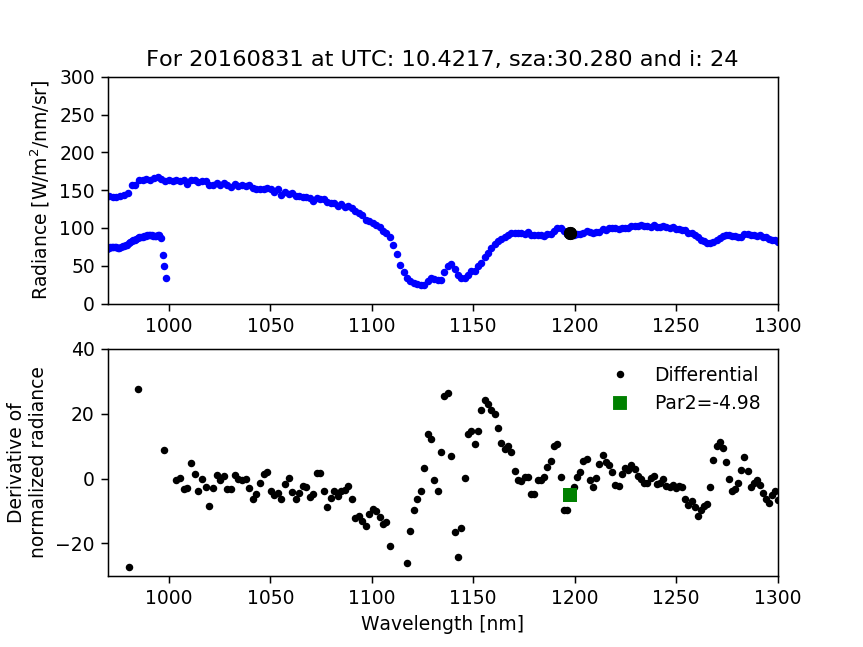

In [256]:
fig, ax1,ax2,line_og,line_sp,line_dsp,line_par = plt_param2(meas.sp[igood][0],meas.wvl)

def init():
    line_og.set_data([], [])
    line_sp.set_data([], [])
    line_dsp.set_data([], [])
    line_par.set_data([], [])
    return fig,ax1,ax2,line_og,line_sp,line_dsp,line_par

def animate(i):
    sp,wvl = meas.sp[igood][i],meas.wvl
    ax1.set_title('For {} at UTC: {:2.4f}, sza:{:2.3f} and i: {}'.format(daystr,meas.utc[igood][i],meas.sza[igood][i][0],i))
    spc, mask = nanmasked(sp)
    wvln = wvl[mask]
    i1000 = np.argmin(abs(wvln-1000.0))
    i1198 = np.argmin(abs(wvln-1198.0))
    norm2 = spc/spc[i1000]
    dsp = smooth(deriv(norm2,wvln/1000.0),2,nan=False,old=True)

    par2 = dsp[i1198]
    
    line_og.set_data(wvln,spc)
    line_sp.set_data([wvln[i1198],wvln[i1198]],[spc[i1198],spc[i1198]])
    line_dsp.set_data(wvln,dsp)
    line_par.set_data([wvln[i1198],wvln[i1198]],[par2,par2])
    
    line_par.set_label('Par2={:2.2f}'.format(par2))
    ax2.legend(frameon=False)
    
    return fig,ax1,ax2,line_og,line_sp,line_dsp,line_par

anim = animation.FuncAnimation(fig, animate,init_func=init,frames=len(meas.utc[igood]), interval=20, blit=True)

#HTML(anim.to_jshtml())

In [186]:
metadata = dict(artist='Samuel LeBlanc',title='Parameter 2 animations for {}'.format(daystr),
                comment='Created on {} with the program {}'.format(datetime.now(),nb_name))

In [187]:
# Set up formatting for the movie files
Writer = animation.writers['ffmpeg']
writer = Writer(fps=10, metadata=metadata, bitrate=1800)
anim.save(fp+'starzen/Parameter2_{}.mp4'.format(daystr),writer=writer)

### Plot out the animation for the LUT

<IPython.core.display.Javascript object>


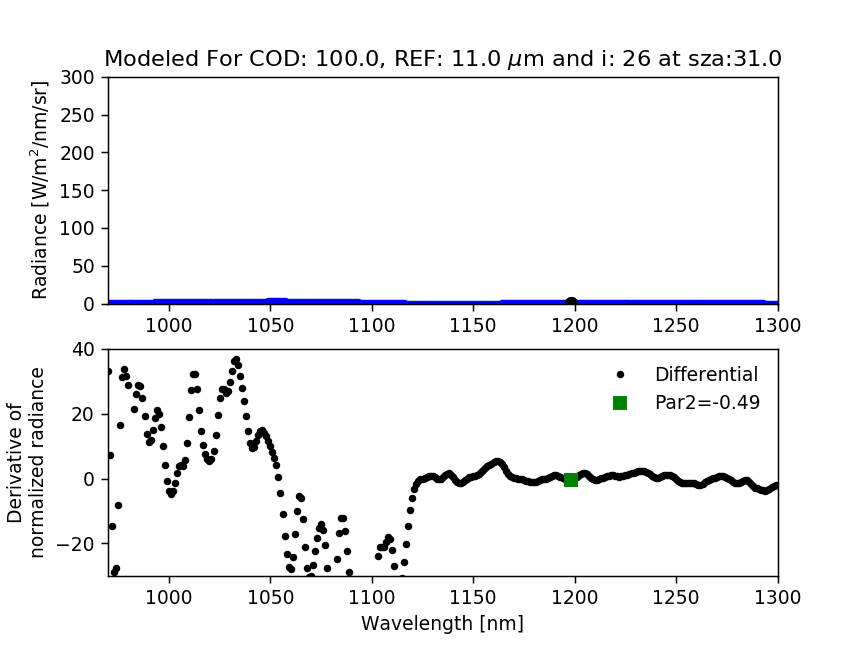

In [257]:
fig, ax1,ax2,line_og,line_sp,line_dsp,line_par = plt_param2(lut[1].sp[0,:,0,10,0],lut[1].wvl)

def init():
    line_og.set_data([], [])
    line_sp.set_data([], [])
    line_dsp.set_data([], [])
    line_par.set_data([], [])
    return fig,ax1,ax2,line_og,line_sp,line_dsp,line_par

def animate(i):
    sp,wvl = lut[1].sp[0,:,0,10,i],lut[1].wvl
    ax1.set_title('Modeled For COD: {}, REF: {} $\\mu$m and i: {} at sza:{}'.format(lut[1].tausp[i],lut[1].refsp[10],i,lut[1].sza[1]))
    spc, mask = nanmasked(sp)
    wvln = wvl[mask]
    i1000 = np.argmin(abs(wvln-1000.0))
    i1198 = np.argmin(abs(wvln-1198.0))
    norm2 = spc/spc[i1000]
    dsp = smooth(deriv(norm2,wvln/1000.0),2,nan=False,old=True)

    par2 = dsp[i1198]
    
    line_og.set_data(wvln,spc)
    line_sp.set_data([wvln[i1198],wvln[i1198]],[spc[i1198],spc[i1198]])
    line_dsp.set_data(wvln,dsp)
    line_par.set_data([wvln[i1198],wvln[i1198]],[par2,par2])
    
    line_par.set_label('Par2={:2.2f}'.format(par2))
    ax2.legend(frameon=False)
    
    return fig,ax1,ax2,line_og,line_sp,line_dsp,line_par

anim = animation.FuncAnimation(fig, animate,init_func=init,frames=len(lut[1].tausp), interval=10, blit=True)

#HTML(anim.to_jshtml())

In [191]:
metadata = dict(artist='Samuel LeBlanc',title='Parameter 2 animations for LUT file {} for sza: {}'.format(fp_lut_mat.split('/')[-1],lut[1].sza[1]),
                comment='Created on {} with the program {}'.format(datetime.now(),nb_name))

In [192]:
# Set up formatting for the movie files
Writer = animation.writers['ffmpeg']
writer = Writer(fps=10, metadata=metadata, bitrate=1800)
anim.save(fp+'starzen/Parameter2_LUT_{}.mp4'.format(vlut),writer=writer)

## Parameter 3: Derivative at 1500 nm

### Define Parameter 3

In [205]:
def plt_param3(sp,wvl,fig=None):
    from Sp_parameters import nanmasked
    if not fig:
        fig = plt.figure()

    spc, mask = nanmasked(sp)
    wvln = wvl[mask]
    i1000 = np.argmin(abs(wvln-1000.0))
    i1493 = np.argmin(abs(wvln-1493.0))
    norm2 = spc/spc[i1000]
    dsp = smooth(deriv(norm2,wvln/1000.0),2,nan=False,old=True)

    par3 = dsp[i1493]
    
    ax1 = fig.add_subplot(2,1,1)
    line_og = ax1.plot(wvln,spc,'.b',label='original')
    line_sp = ax1.plot([wvln[i1493],wvln[i1493]],[spc[i1493],spc[i1493]],'ok')
    ax1.set_ylabel('Radiance [W/m$^2$/nm/sr]')
    ax1.set_ylim(0,150.0)
    
    ax2 = fig.add_subplot(2,1,2,sharex=ax1)
    line_dsp = ax2.plot(wvln,dsp,'.k',label='Differential')
    line_par = ax2.plot([wvln[i1493],wvln[i1493]],[par3,par3],'sg',label='Par3={:2.2f}'.format(par3)) 
    ax2.set_xlim(1450,1650)
    ax2.set_ylim(-20,20)
    ax2.set_ylabel('Derivative of\nnormalized radiance')
    ax2.set_xlabel('Wavelength [nm]')
    
    plt.legend(frameon=False)
    return fig, ax1,ax2,line_og[0],line_sp[0],line_dsp[0],line_par[0]

In [206]:
sp = meas.sp[igood][0]
wvl = meas.wvl

<IPython.core.display.Javascript object>


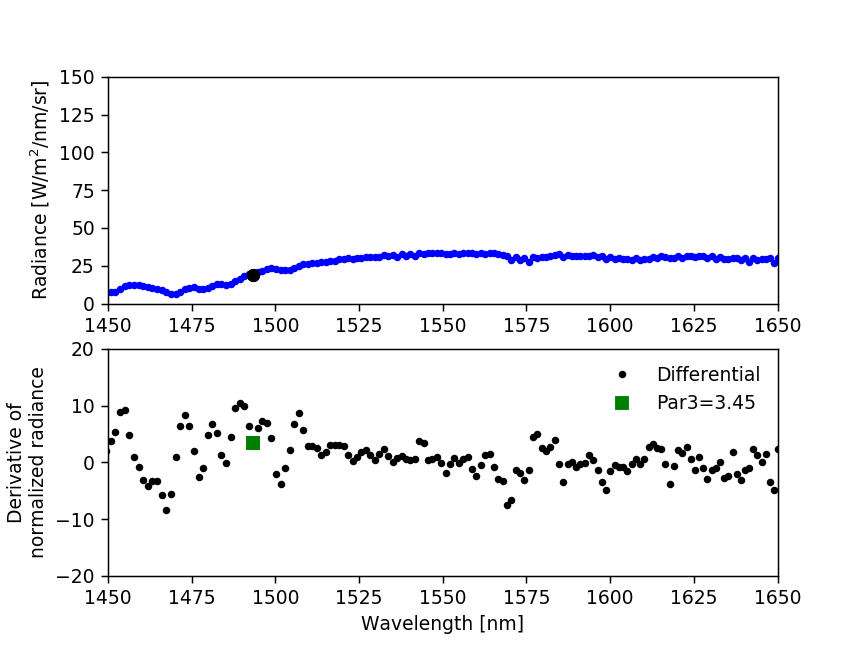

(<Figure size 640x480 with 2 Axes>,
 <matplotlib.lines.Line2D at 0x7fc1436bcd10>)

In [208]:
plt_param3(meas.sp[igood][0],meas.wvl)

### Plot the measurements

<IPython.core.display.Javascript object>


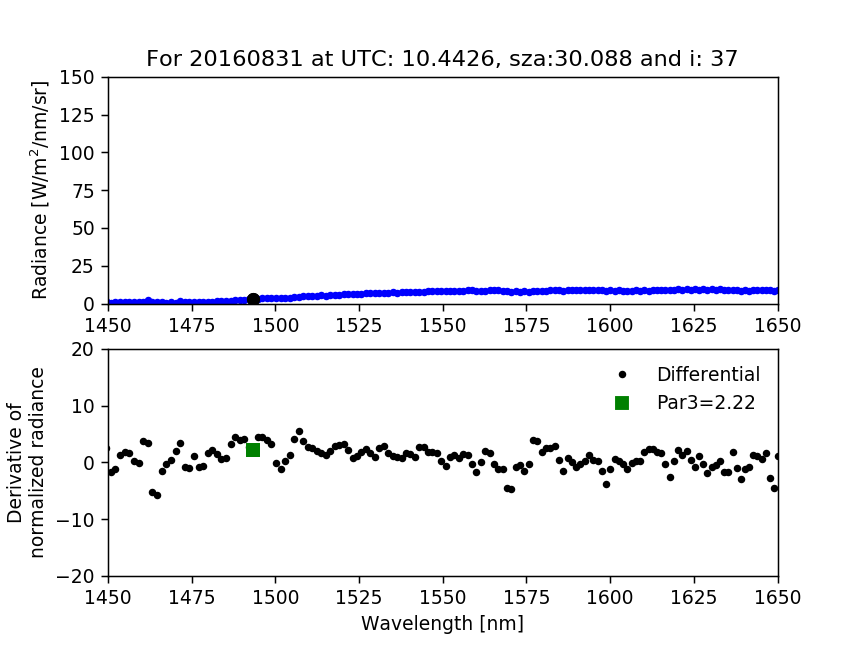

In [258]:
fig, ax1,ax2,line_og,line_sp,line_dsp,line_par = plt_param3(meas.sp[igood][0],meas.wvl)

def init():
    line_og.set_data([], [])
    line_sp.set_data([], [])
    line_dsp.set_data([], [])
    line_par.set_data([], [])
    return fig,ax1,ax2,line_og,line_sp,line_dsp,line_par

def animate(i):
    sp,wvl = meas.sp[igood][i],meas.wvl
    ax1.set_title('For {} at UTC: {:2.4f}, sza:{:2.3f} and i: {}'.format(daystr,meas.utc[igood][i],meas.sza[igood][i][0],i))
    spc, mask = nanmasked(sp)
    wvln = wvl[mask]
    i1000 = np.argmin(abs(wvln-1000.0))
    i1493 = np.argmin(abs(wvln-1493.0))
    norm2 = spc/spc[i1000]
    dsp = smooth(deriv(norm2,wvln/1000.0),2,nan=False,old=True)

    par3 = dsp[i1493]
    
    line_og.set_data(wvln,spc)
    line_sp.set_data([wvln[i1493],wvln[i1493]],[spc[i1493],spc[i1493]])
    line_dsp.set_data(wvln,dsp)
    line_par.set_data([wvln[i1493],wvln[i1493]],[par3,par3])
    
    line_par.set_label('Par3={:2.2f}'.format(par3))
    ax2.legend(frameon=False)
    
    return fig,ax1,ax2,line_og,line_sp,line_dsp,line_par

anim = animation.FuncAnimation(fig, animate,init_func=init,frames=len(meas.utc[igood]), interval=10, blit=True)

#HTML(anim.to_jshtml())

In [210]:
metadata = dict(artist='Samuel LeBlanc',title='Parameter 3 animations for {}'.format(daystr),
                comment='Created on {} with the program {}'.format(datetime.now(),nb_name))

In [211]:
# Set up formatting for the movie files
Writer = animation.writers['ffmpeg']
writer = Writer(fps=10, metadata=metadata, bitrate=1800)
anim.save(fp+'starzen/Parameter3_{}.mp4'.format(daystr),writer=writer)

### Plot the animations for the LUT

<IPython.core.display.Javascript object>


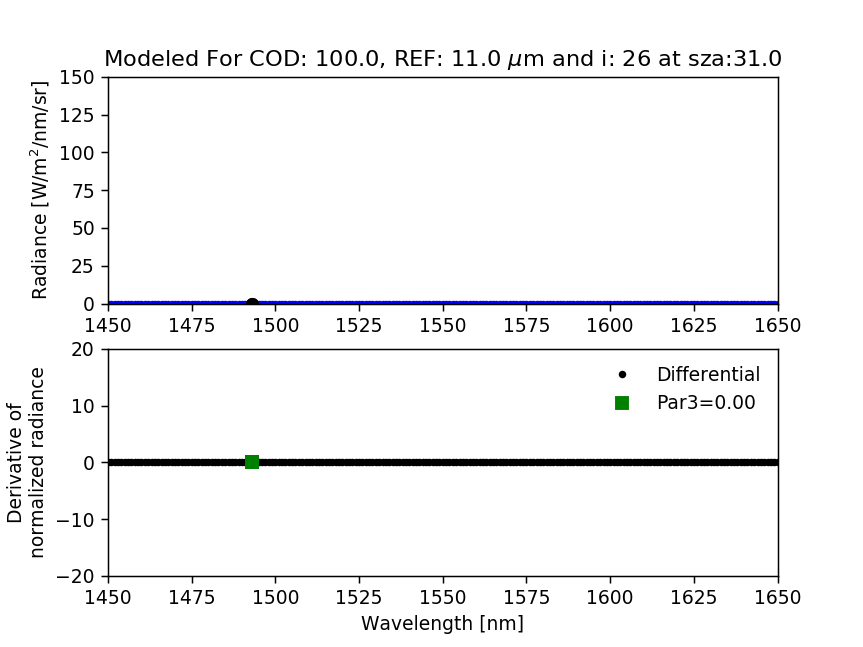

In [259]:
fig, ax1,ax2,line_og,line_sp,line_dsp,line_par = plt_param3(lut[1].sp[0,:,0,10,0],lut[1].wvl)

def init():
    line_og.set_data([], [])
    line_sp.set_data([], [])
    line_dsp.set_data([], [])
    line_par.set_data([], [])
    return fig,ax1,ax2,line_og,line_sp,line_dsp,line_par

def animate(i):
    sp,wvl = lut[1].sp[0,:,0,10,i],lut[1].wvl
    ax1.set_title('Modeled For COD: {}, REF: {} $\\mu$m and i: {} at sza:{}'.format(lut[1].tausp[i],lut[1].refsp[10],i,lut[1].sza[1]))
    spc, mask = nanmasked(sp)
    wvln = wvl[mask]
    i1000 = np.argmin(abs(wvln-1000.0))
    i1493 = np.argmin(abs(wvln-1493.0))
    norm2 = spc/spc[i1000]
    dsp = smooth(deriv(norm2,wvln/1000.0),2,nan=False,old=True)

    par3 = dsp[i1493]
    
    line_og.set_data(wvln,spc)
    line_sp.set_data([wvln[i1493],wvln[i1493]],[spc[i1493],spc[i1493]])
    line_dsp.set_data(wvln,dsp)
    line_par.set_data([wvln[i1493],wvln[i1493]],[par3,par3])
    
    line_par.set_label('Par3={:2.2f}'.format(par3))
    ax2.legend(frameon=False)
    
    return fig,ax1,ax2,line_og,line_sp,line_dsp,line_par

anim = animation.FuncAnimation(fig, animate,init_func=init,frames=len(lut[1].tausp), interval=10, blit=True)

#HTML(anim.to_jshtml())

In [213]:
metadata = dict(artist='Samuel LeBlanc',title='Parameter 3 animations for LUT file {} for sza: {}'.format(fp_lut_mat.split('/')[-1],lut[1].sza[1]),
                comment='Created on {} with the program {}'.format(datetime.now(),nb_name))

In [214]:
# Set up formatting for the movie files
Writer = animation.writers['ffmpeg']
writer = Writer(fps=10, metadata=metadata, bitrate=1800)
anim.save(fp+'starzen/Parameter3_LUT_{}.mp4'.format(vlut),writer=writer)

## Parameter 4: Ratio between 1200 nm / 1237 nm

### Define Parameter 4

In [243]:
def plt_param4(sp,wvl,fig=None):
    import Sp_parameters as Sp
    import numpy as np
    if not fig:
        fig = plt.figure()

    spc, mask = Sp.nanmasked(sp)
    wvln = wvl[mask]
    i1198 = np.argmin(abs(wvln-1198.0))
    i1236 = np.argmin(abs(wvln-1236.0))
    iws = np.where((wvln>=315.0)&(wvln<=940.0))[0]
    norm = spc/np.nanmax(spc[iws]) 
    par4 = norm[i1198]/norm[i1236]
    
    
    line_og = plt.plot(wvln,norm,'.b',label='normed to max')
    line_lo = plt.plot([wvln[i1198],wvln[i1198]],[norm[i1198],norm[i1198]],'sg',label='norm at 1200 nm')
    line_loh = plt.axhline(norm[i1198],color='g')
    line_lov = plt.axvline(wvln[i1198],color='g')
    line_hi = plt.plot([wvln[i1236],wvln[i1236]],[norm[i1236],norm[i1236]],'sr',
                       label='norm at 1236 nm\nPar4:{:2.2f}'.format(par4))
    line_hih = plt.axhline(norm[i1236],color='r')
    line_hiv = plt.axvline(wvln[i1236],color='r')
    
    plt.xlim(1100,1300)
    plt.ylim(0,0.5)
    plt.xlabel('Wavelength [nm]')
    plt.ylabel('Normed Radiance to max')
    plt.grid()
    
    plt.legend(frameon=False)
    return fig, line_og[0],line_lo[0],line_loh,line_hi[0],line_hih

<IPython.core.display.Javascript object>


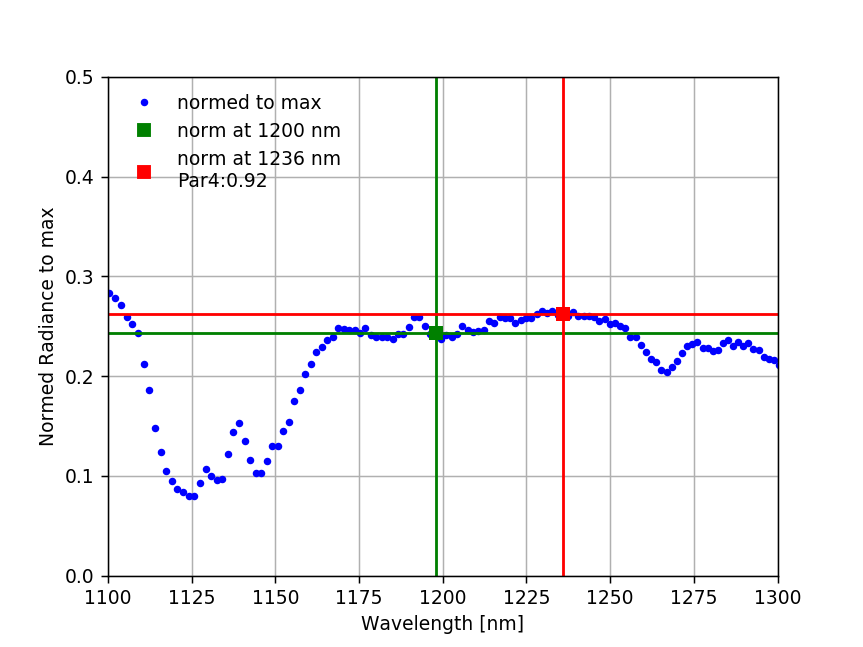

In [244]:
fig,line_og,line_lo,line_loh,line_hi,line_hih = plt_param4(sp,wvl)

### Plot the measurements

<IPython.core.display.Javascript object>


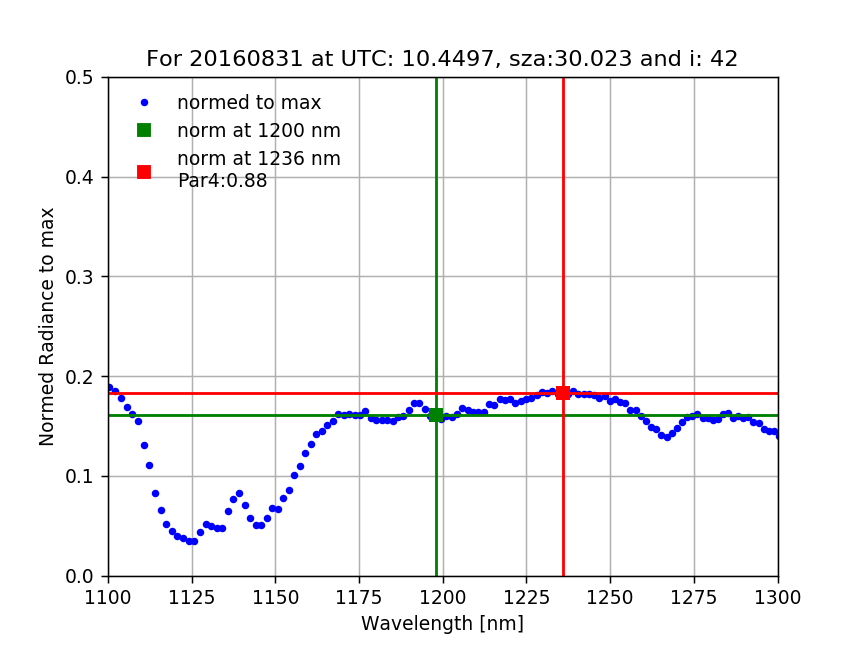

In [260]:
fig,line_og,line_lo,line_loh,line_hi,line_hih = plt_param4(meas.sp[igood][0],meas.wvl)

def init():
    line_og.set_data([], [])
    line_lo.set_data([], [])
    line_loh.set_data([],[])
    line_hi.set_data([], [])
    line_hih.set_data([],[])
    return fig,line_og,line_lo,line_loh,line_hi,line_hih

def animate(i):
    sp,wvl = meas.sp[igood][i],meas.wvl
    plt.title('For {} at UTC: {:2.4f}, sza:{:2.3f} and i: {}'.format(daystr,meas.utc[igood][i],meas.sza[igood][i][0],i))
    spc, mask = Sp.nanmasked(sp)
    wvln = wvl[mask]
    i1198 = np.argmin(abs(wvln-1198.0))
    i1236 = np.argmin(abs(wvln-1236.0))
    iws = np.where((wvln>=315.0)&(wvln<=940.0))[0]
    norm = spc/np.nanmax(spc[iws]) 
    par4 = norm[i1198]/norm[i1236]
    
    line_og.set_data(wvln,norm)
    line_lo.set_data([wvln[i1198],wvln[i1198]],[norm[i1198],norm[i1198]])
    line_loh.set_data([0,1],[norm[i1198],norm[i1198]])
    line_hi.set_data([wvln[i1236],wvln[i1236]],[norm[i1236],norm[i1236]])
    line_hih.set_data([0,1],[norm[i1236],norm[i1236]])
    line_hi.set_label('norm at 1236 nm\nPar4:{:2.2f}'.format(par4))
    plt.legend(frameon=False)
    
    return fig,line_og,line_lo,line_loh,line_hi,line_hih

anim = animation.FuncAnimation(fig, animate,init_func=init,frames=len(meas.utc[igood]), interval=10, blit=True)

#HTML(anim.to_jshtml())

In [247]:
metadata = dict(artist='Samuel LeBlanc',title='Parameter 4 animations for {}'.format(daystr),
                comment='Created on {} with the program {}'.format(datetime.now(),nb_name))

In [248]:
# Set up formatting for the movie files
Writer = animation.writers['ffmpeg']
writer = Writer(fps=10, metadata=metadata, bitrate=1800)
anim.save(fp+'starzen/Parameter4_{}.mp4'.format(daystr),writer=writer)

### Plot the animations for the LUT

<IPython.core.display.Javascript object>


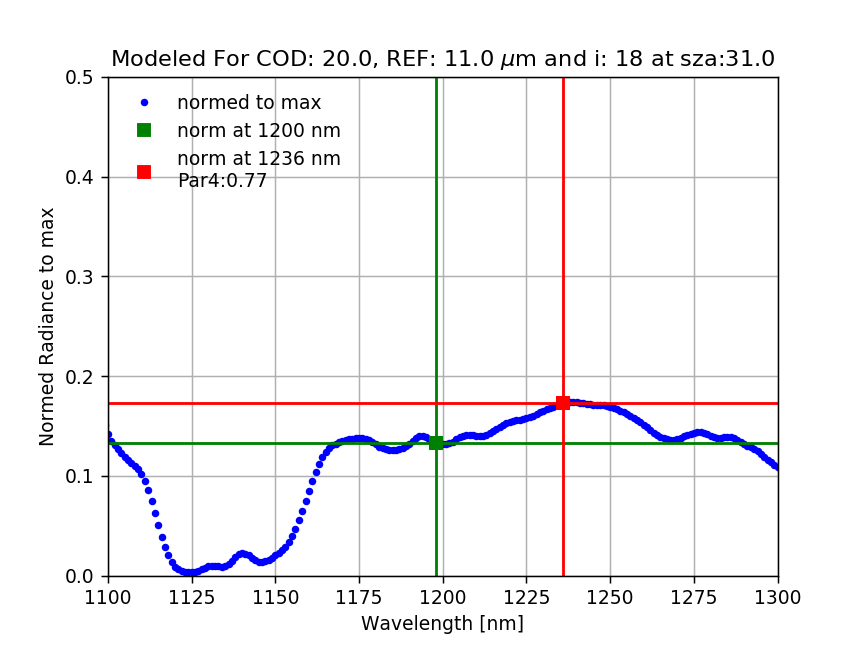

In [261]:
fig,line_og,line_lo,line_loh,line_hi,line_hih = plt_param4(lut[1].sp[0,:,0,10,0],lut[1].wvl)

def init():
    line_og.set_data([], [])
    line_lo.set_data([], [])
    line_loh.set_data([],[])
    line_hi.set_data([], [])
    line_hih.set_data([],[])
    return fig,line_og,line_lo,line_loh,line_hi,line_hih

def animate(i):
    sp,wvl = lut[1].sp[0,:,0,10,i],lut[1].wvl
    plt.title('Modeled For COD: {}, REF: {} $\\mu$m and i: {} at sza:{}'.format(lut[1].tausp[i],lut[1].refsp[10],i,lut[1].sza[1]))
    spc, mask = Sp.nanmasked(sp)
    wvln = wvl[mask]
    i1198 = np.argmin(abs(wvln-1198.0))
    i1236 = np.argmin(abs(wvln-1236.0))
    iws = np.where((wvln>=315.0)&(wvln<=940.0))[0]
    norm = spc/np.nanmax(spc[iws]) 
    par4 = norm[i1198]/norm[i1236]
    
    line_og.set_data(wvln,norm)
    line_lo.set_data([wvln[i1198],wvln[i1198]],[norm[i1198],norm[i1198]])
    line_loh.set_data([0,1],[norm[i1198],norm[i1198]])
    line_hi.set_data([wvln[i1236],wvln[i1236]],[norm[i1236],norm[i1236]])
    line_hih.set_data([0,1],[norm[i1236],norm[i1236]])
    line_hi.set_label('norm at 1236 nm\nPar4:{:2.2f}'.format(par4))
    plt.legend(frameon=False)
    
    return fig,line_og,line_lo,line_loh,line_hi,line_hih

anim = animation.FuncAnimation(fig, animate,init_func=init,frames=len(lut[1].tausp), interval=10, blit=True)

#HTML(anim.to_jshtml())

In [252]:
metadata = dict(artist='Samuel LeBlanc',title='Parameter 4 animations for LUT file {} for sza: {}'.format(fp_lut_mat.split('/')[-1],lut[1].sza[1]),
                comment='Created on {} with the program {}'.format(datetime.now(),nb_name))

In [253]:
# Set up formatting for the movie files
Writer = animation.writers['ffmpeg']
writer = Writer(fps=10, metadata=metadata, bitrate=1800)
anim.save(fp+'starzen/Parameter4_LUT_{}.mp4'.format(vlut),writer=writer)

## Parameter 5: mean of normalized rad between 1248 nm - 1270 nm